In [93]:
from approx_ensembles.mnist_prototype.net import MNISTnet
from approx_ensembles.mnist_prototype.dataloader import NoisyMNIST
from approx_ensembles.__config__ import MNIST_LOG_PATH
from torch.utils.data import DataLoader
from approx_ensembles.__config__ import API_KEY

import torch
import numpy as np
import os, sys

import datetime
from pprint import pprint
import matplotlib.pyplot as plt
from pprint import pprint
import IPython.display as ipd
from argparse import Namespace
import torch.nn as nn 
import torch.nn.functional as F
import argparse
import scipy 
from IPython.display import Audio
from tqdm import tqdm
import time
import comet_ml
from pprint import pprint
import pandas as pd
import joblib
import matplotlib



==========small_gau_seed2568_seed_2568==========
*****small_gau_snp_seed2568_seed_2568*****


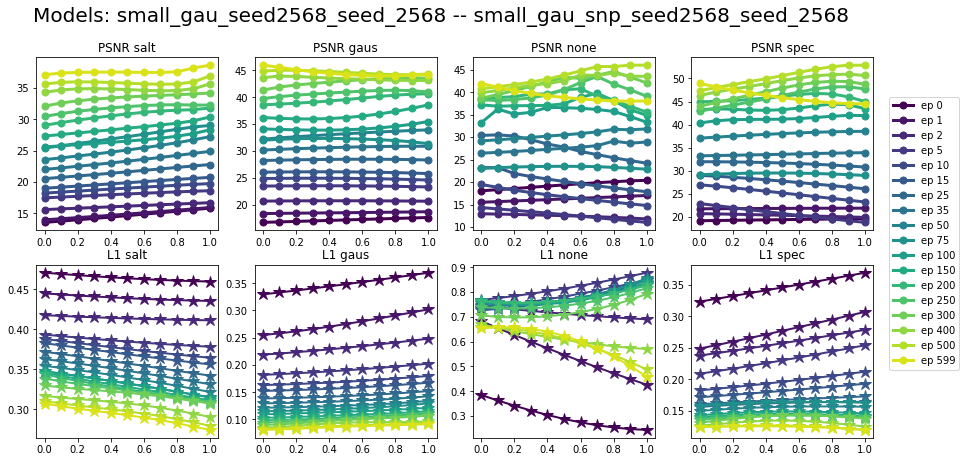

*****small_gau_snp_seed2567_seed_2567*****


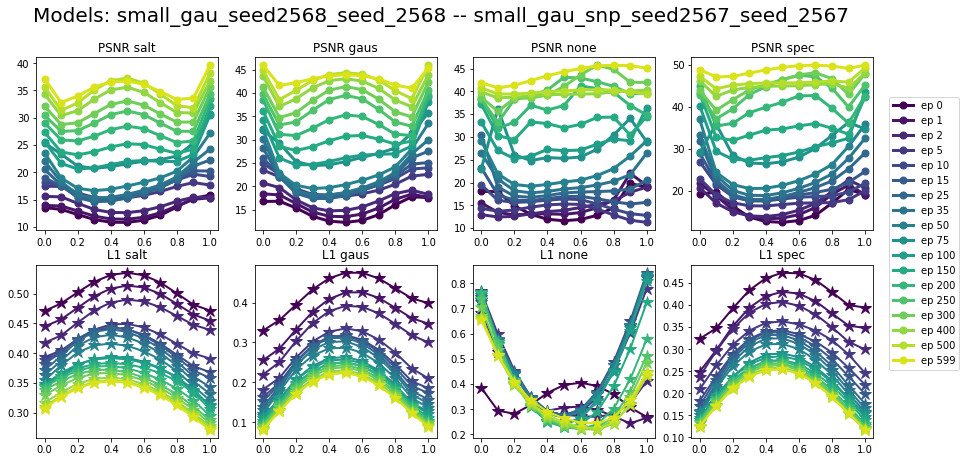

*****small_snp_seed2567_seed_2567*****


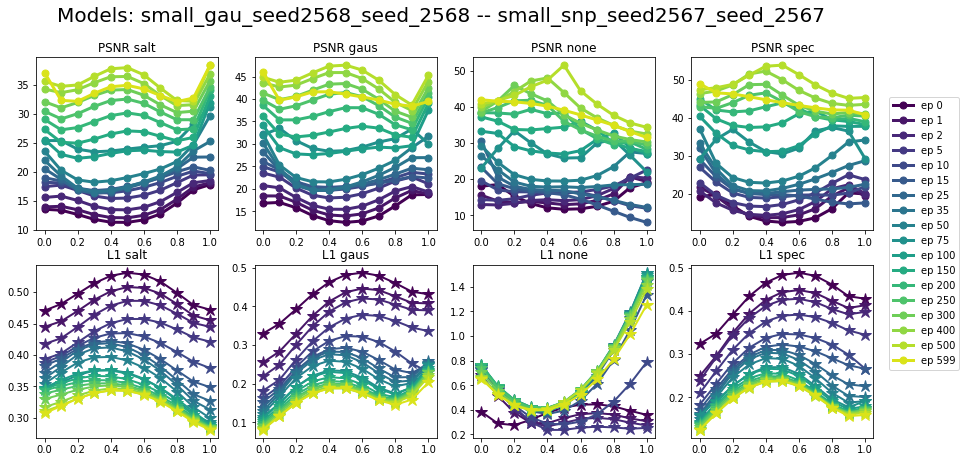

*****small_none_gau_snp_seed2567_seed_2567*****


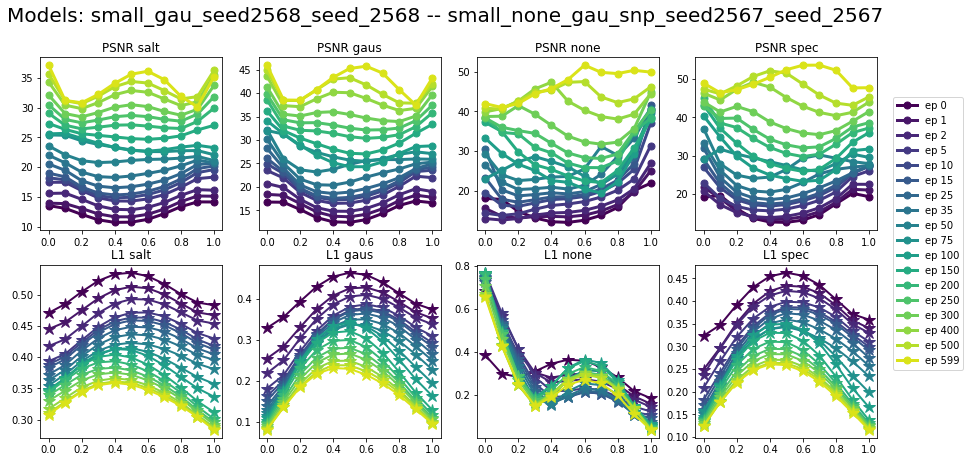

*****small_none_seed_2567*****


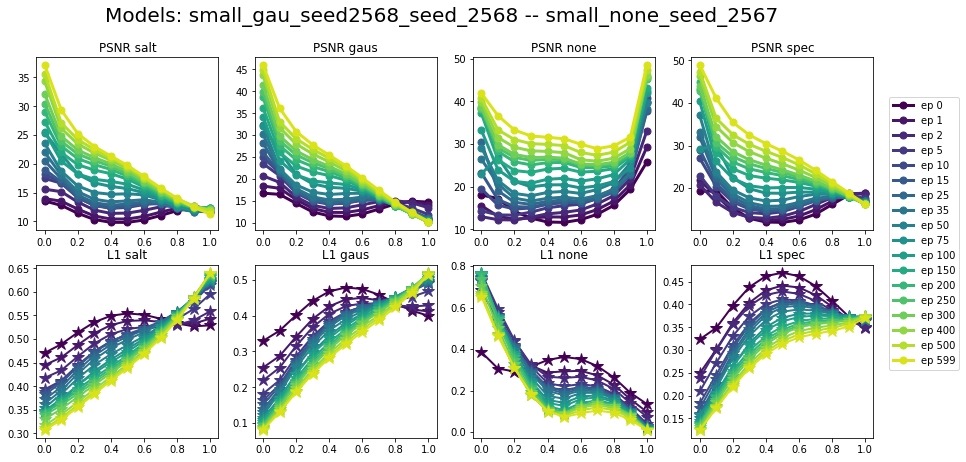

*****small_gau_seed2567_seed_2567*****


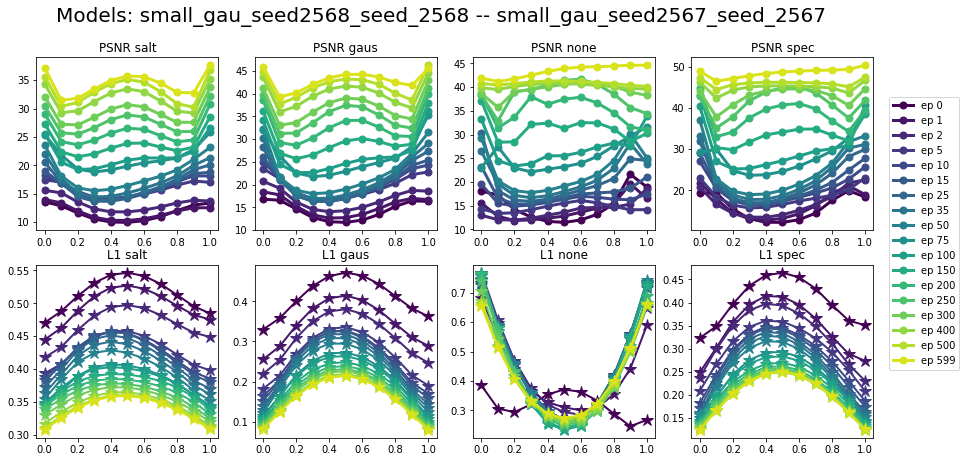

*****small_none_gau_snp_seed2568_seed_2568*****


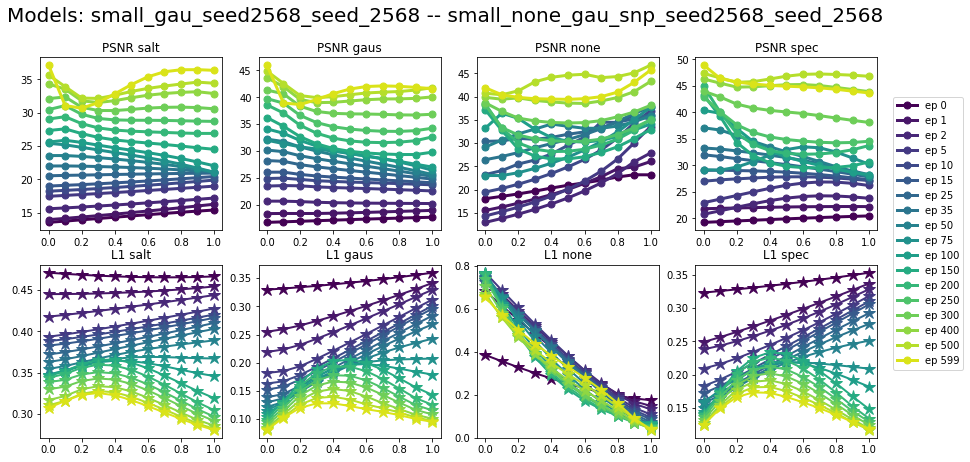

*****small_snp_seed2568_seed_2568*****


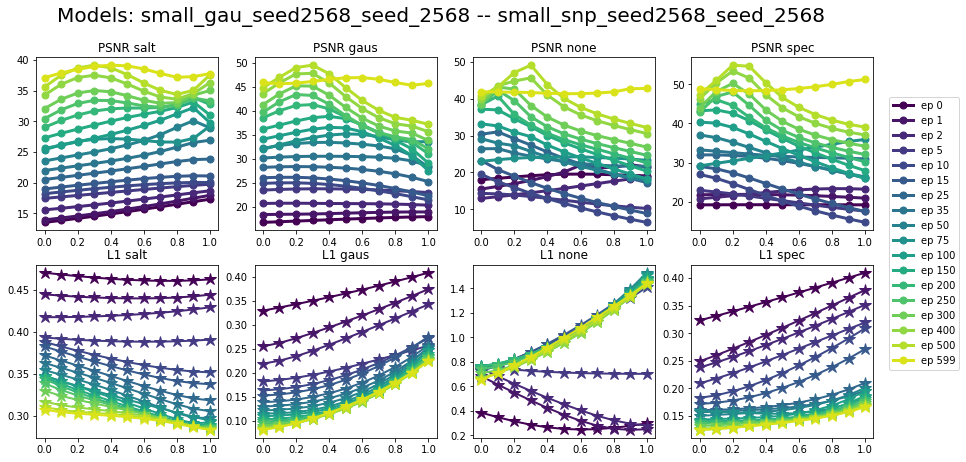

*****small_none_seed_2568_seed_2568*****


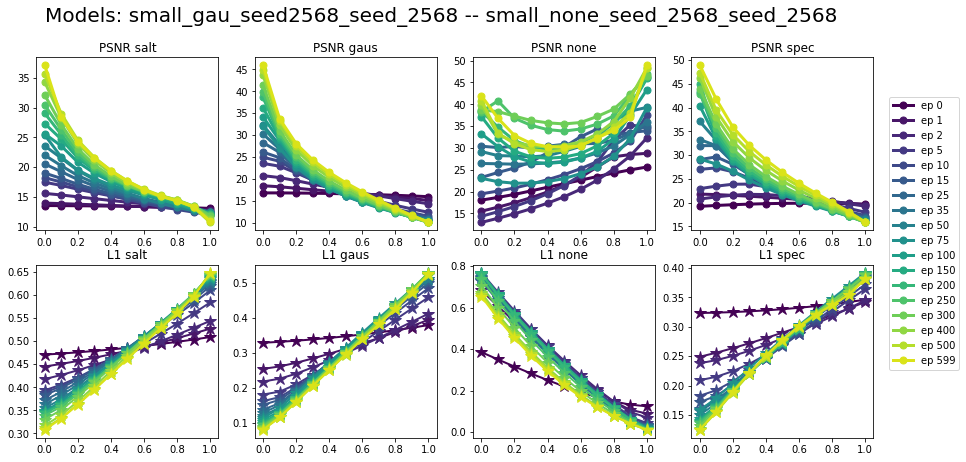

==========big_gau_seed_2568==========
*****big_snp_seed_2567*****


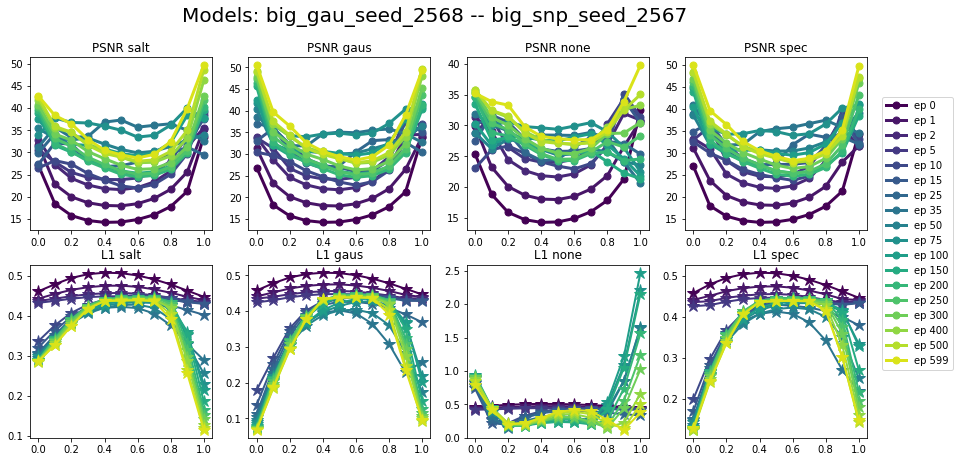

*****big_none_gau_snp_seed_2568*****


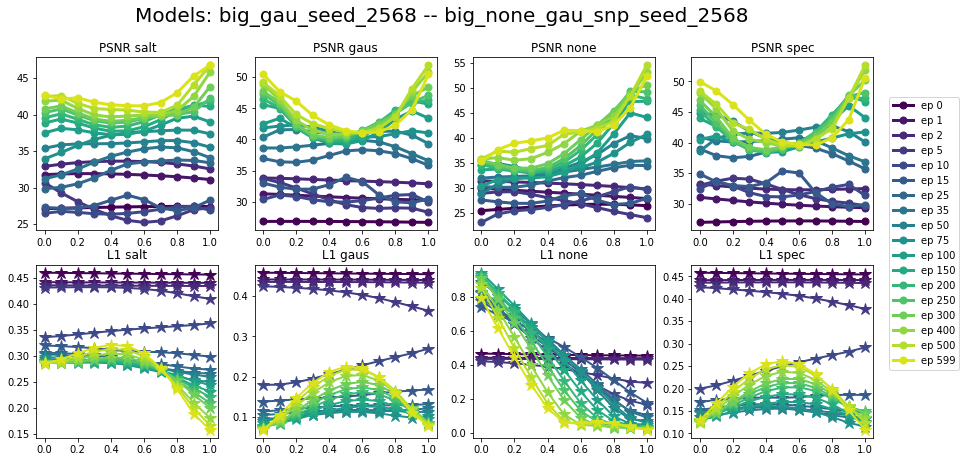

*****big_gau_snp_seed_2567*****


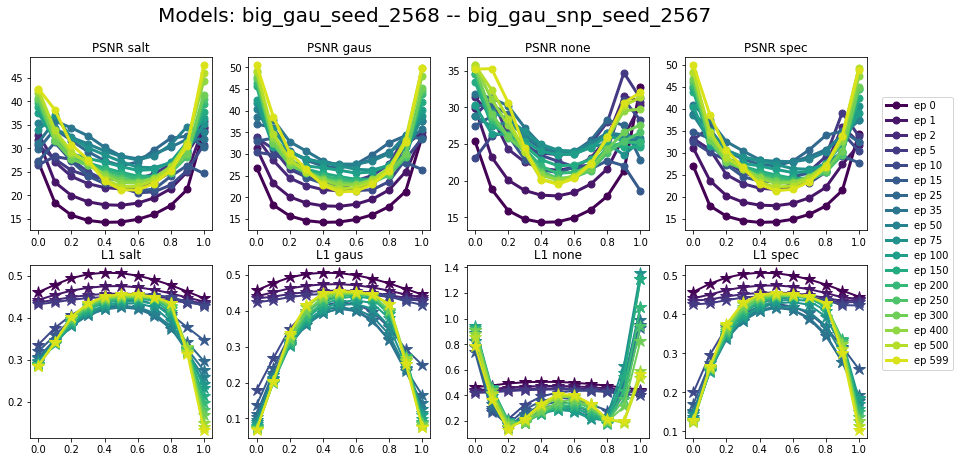

*****big_none_seed_2567*****


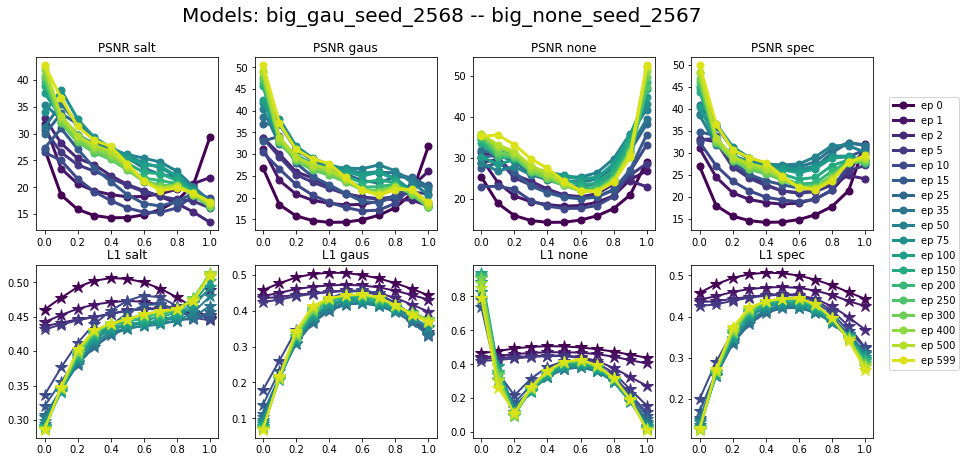

*****big_gau_snp_seed_2568*****


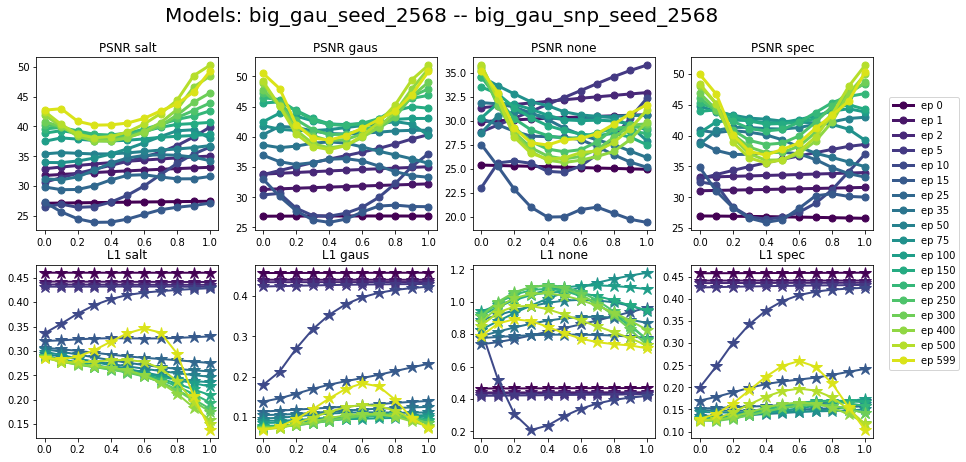

*****big_none_gau_snp_seed_2567*****


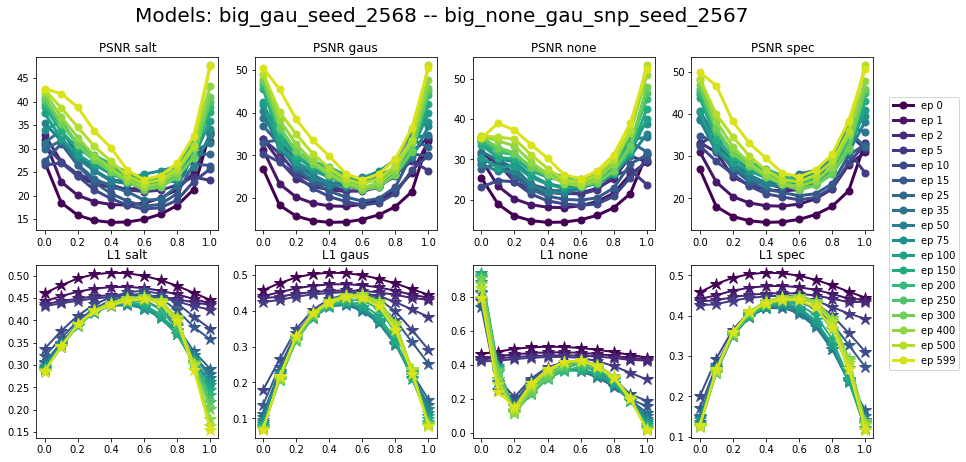

*****big_none_seed_2568*****


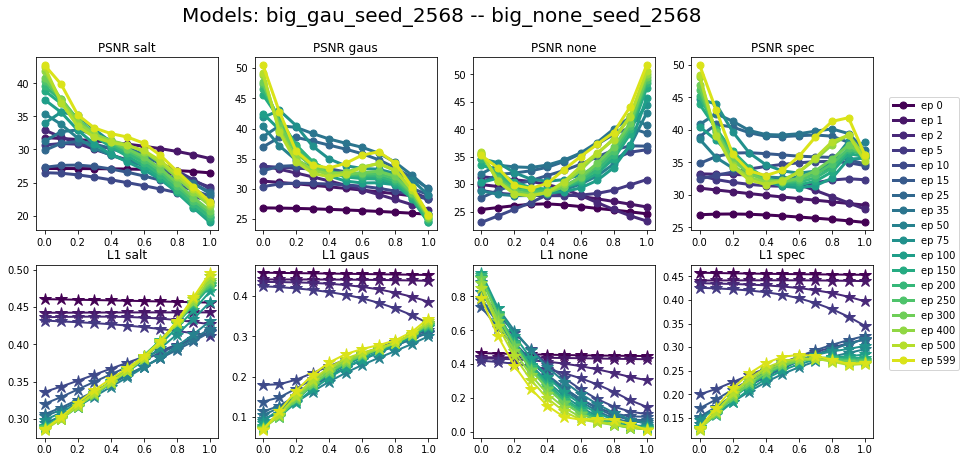

*****big_gau_seed_2567*****


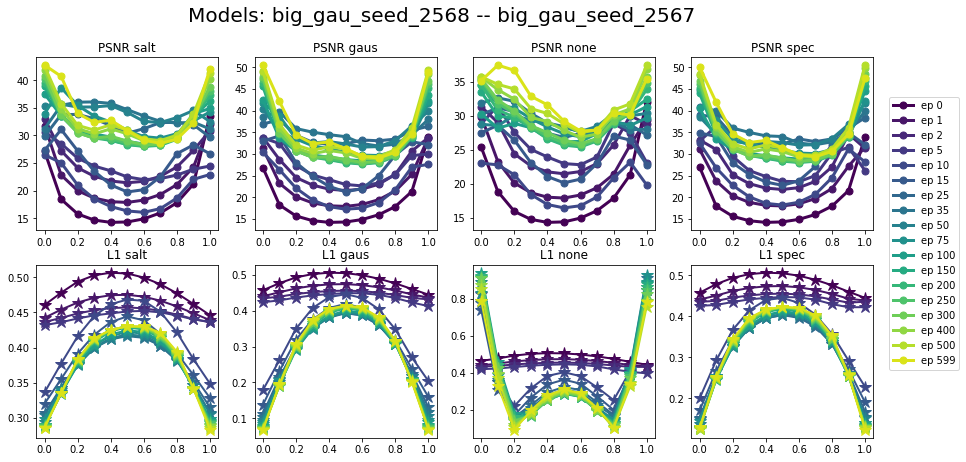

*****big_snp_seed_2568*****


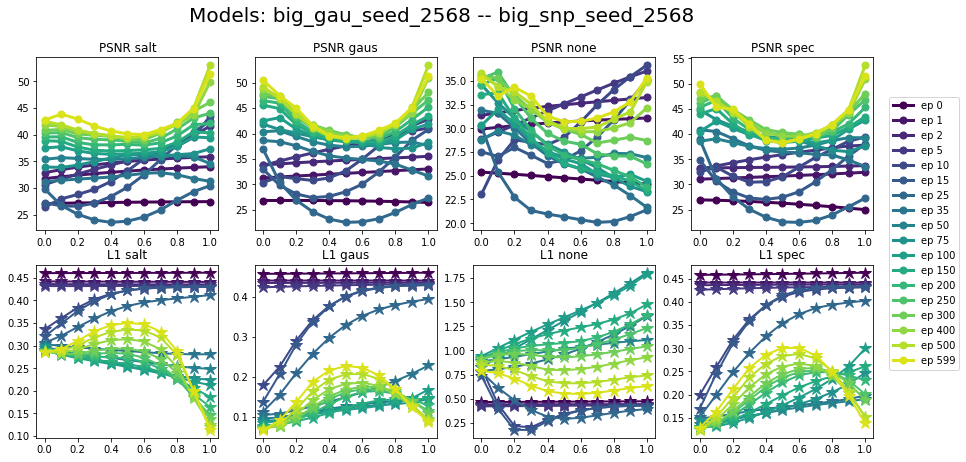

==========big_snp_seed_2568==========
*****big_gau_seed_2568*****


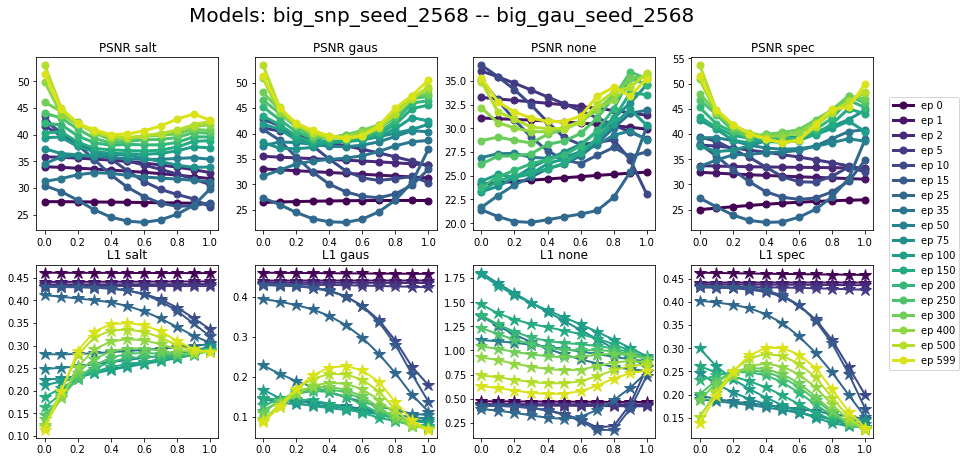

*****big_snp_seed_2567*****


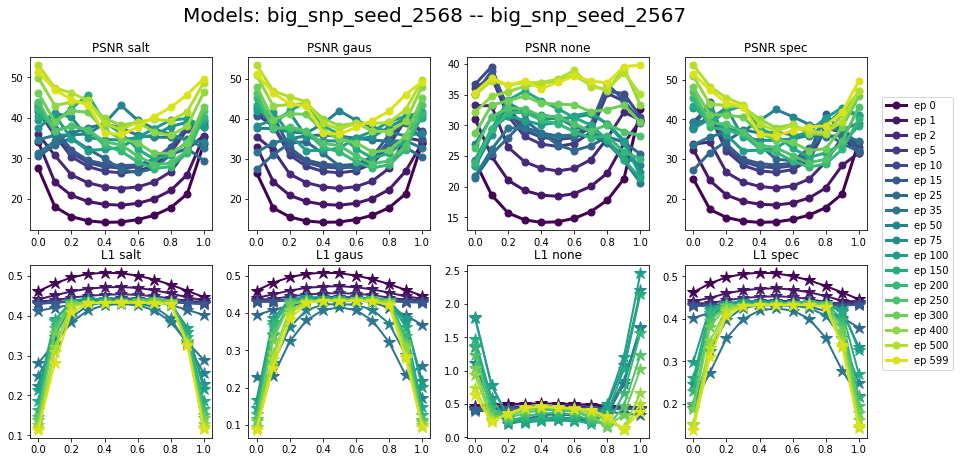

*****big_none_gau_snp_seed_2568*****


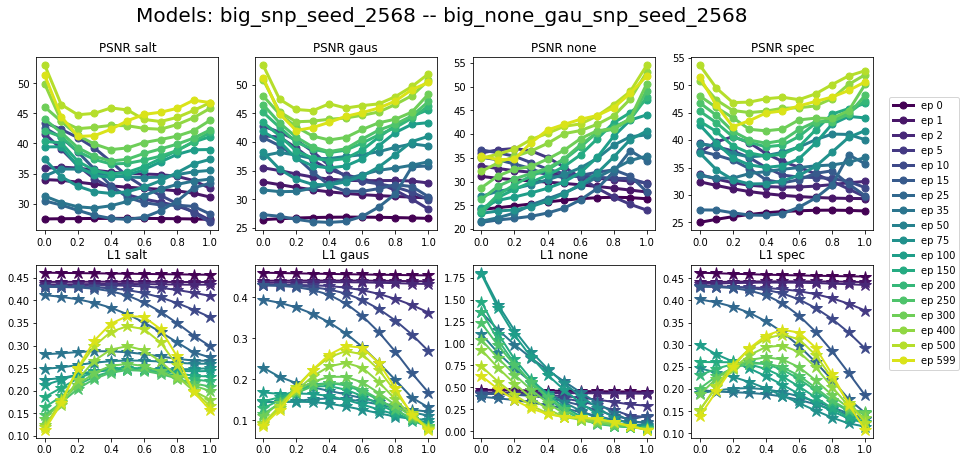

*****big_gau_snp_seed_2567*****


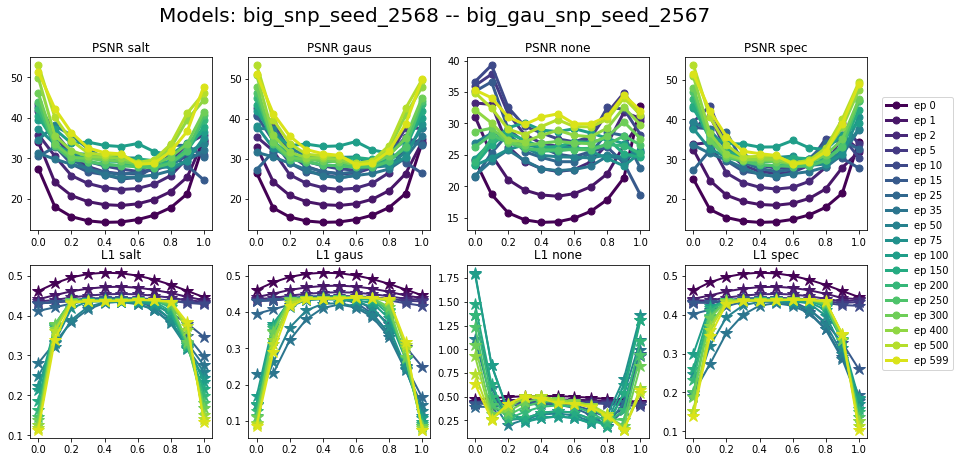

*****big_none_seed_2567*****


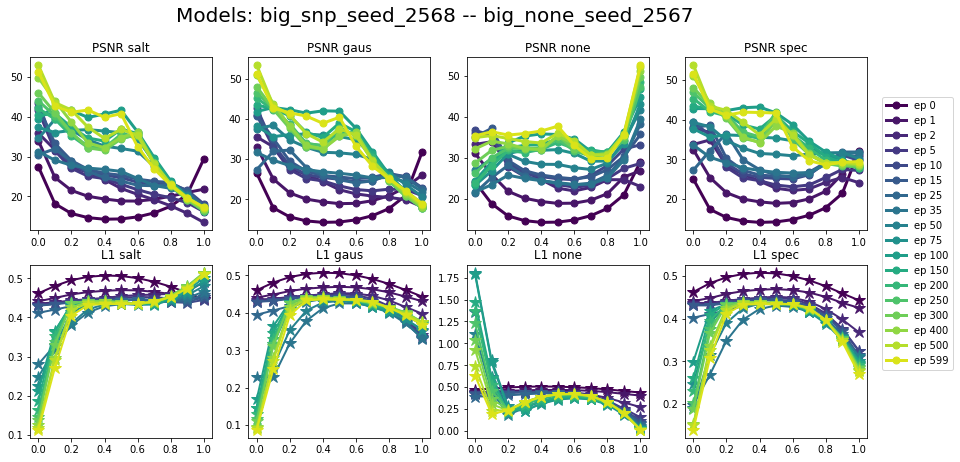

*****big_gau_snp_seed_2568*****


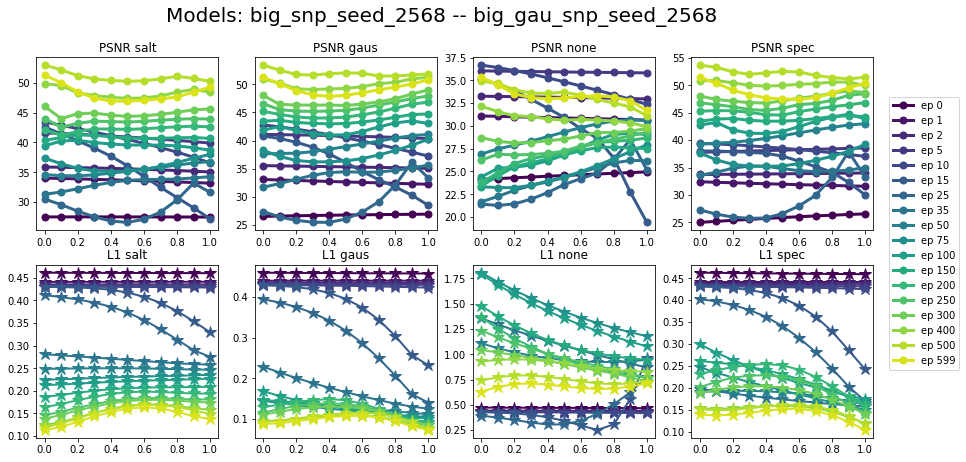

*****big_none_gau_snp_seed_2567*****


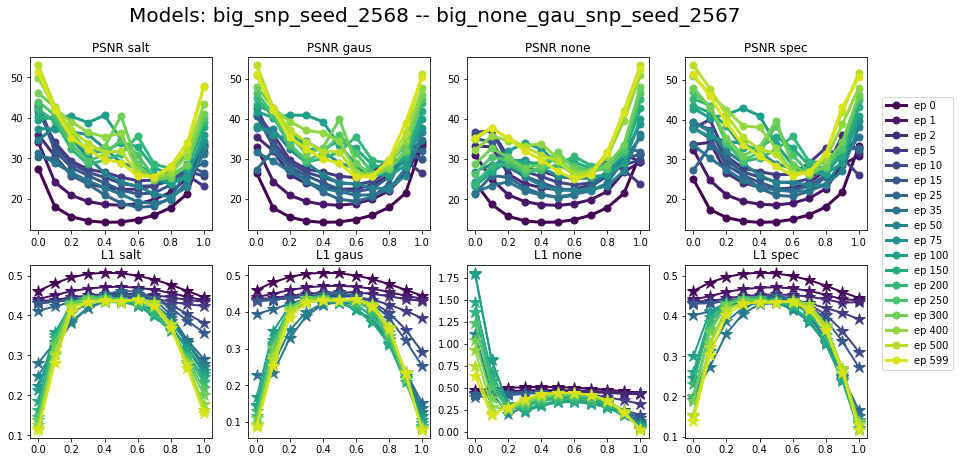

*****big_none_seed_2568*****


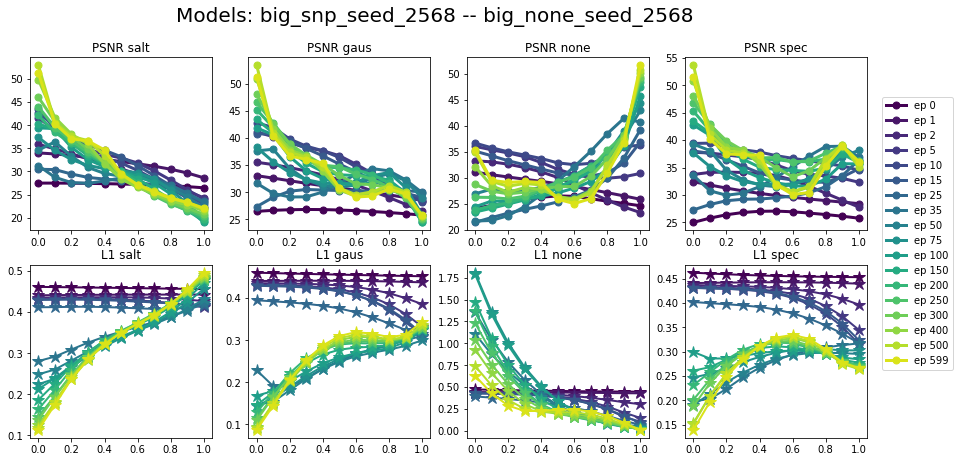

*****big_gau_seed_2567*****


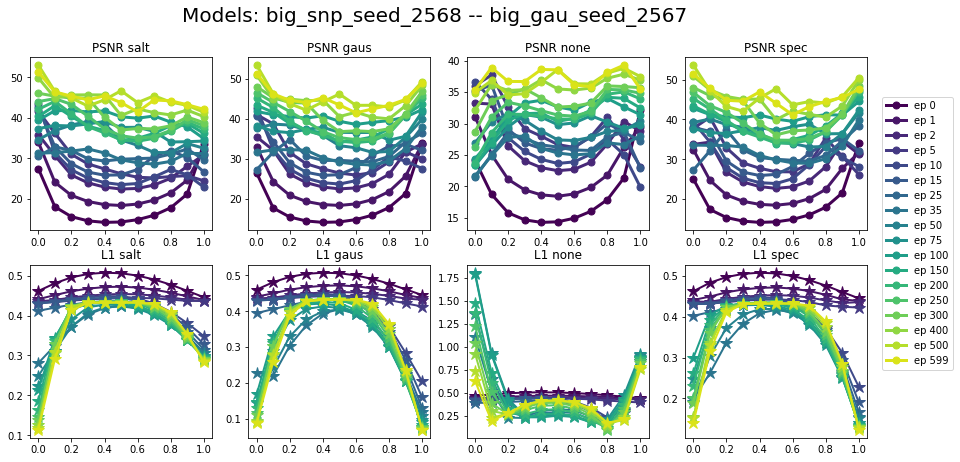

==========small_snp_seed2568_seed_2568==========
*****small_gau_seed2568_seed_2568*****


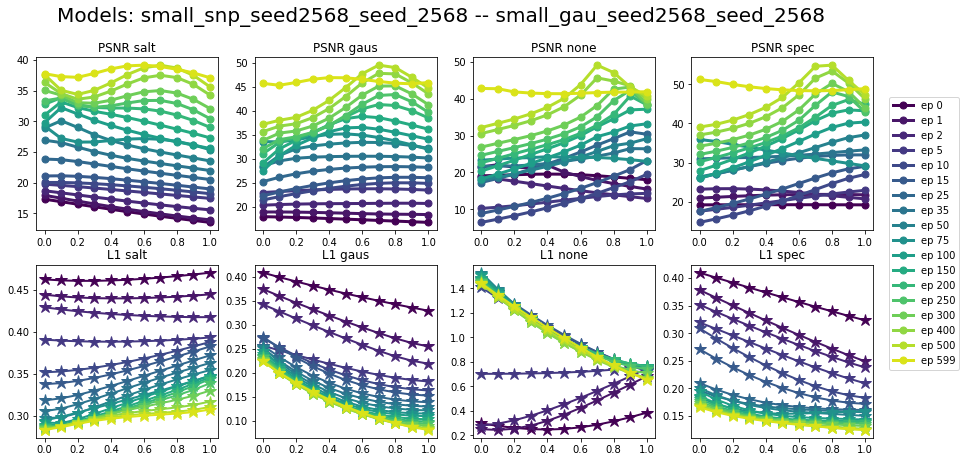

*****small_gau_snp_seed2568_seed_2568*****


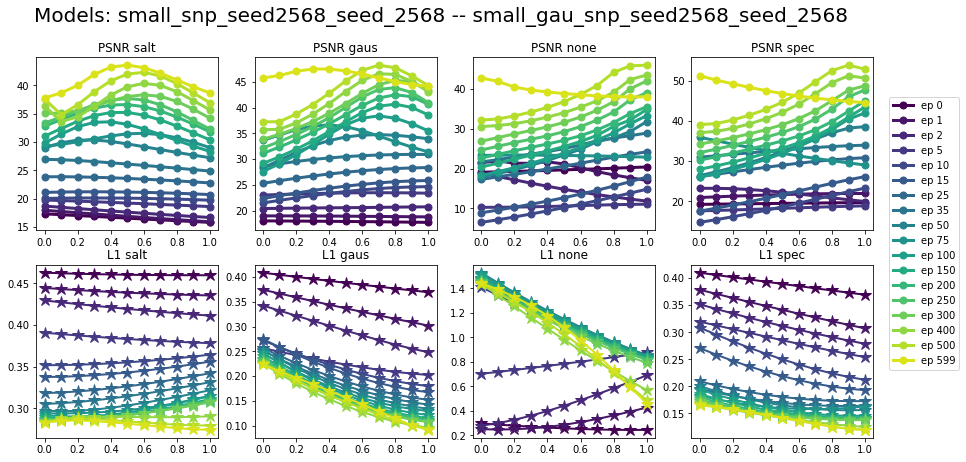

*****small_gau_snp_seed2567_seed_2567*****


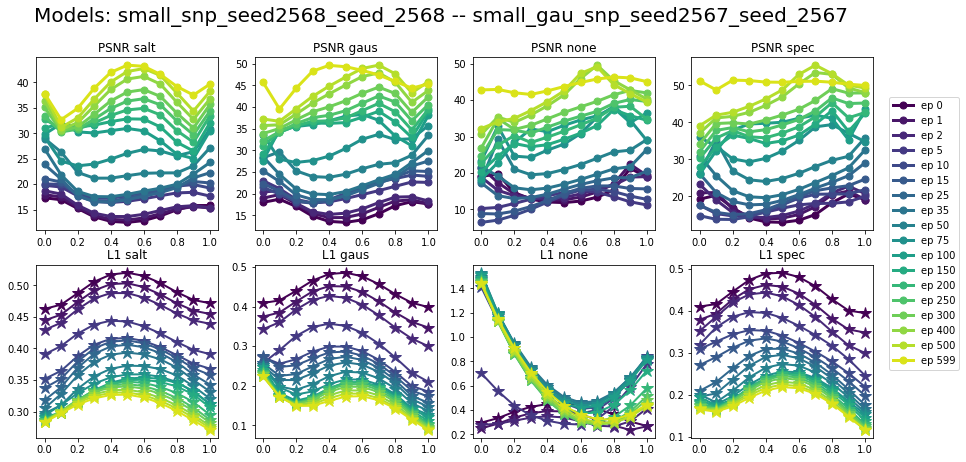

*****small_snp_seed2567_seed_2567*****


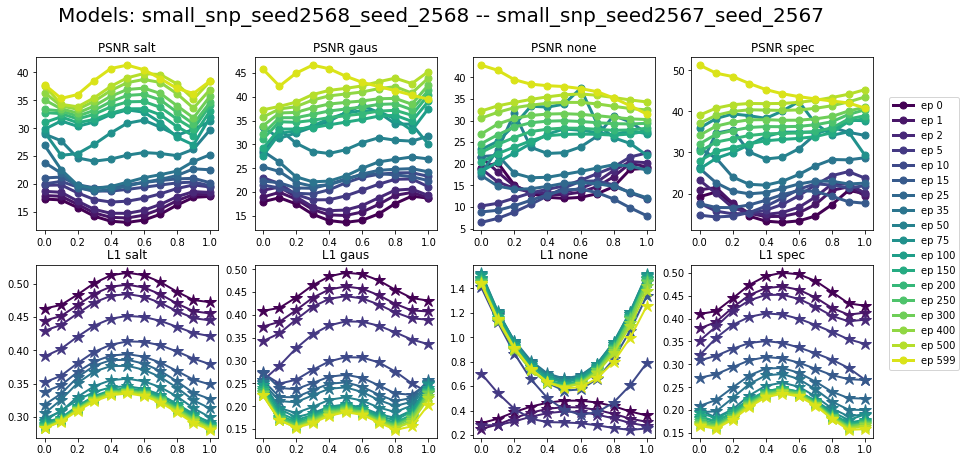

*****small_none_gau_snp_seed2567_seed_2567*****


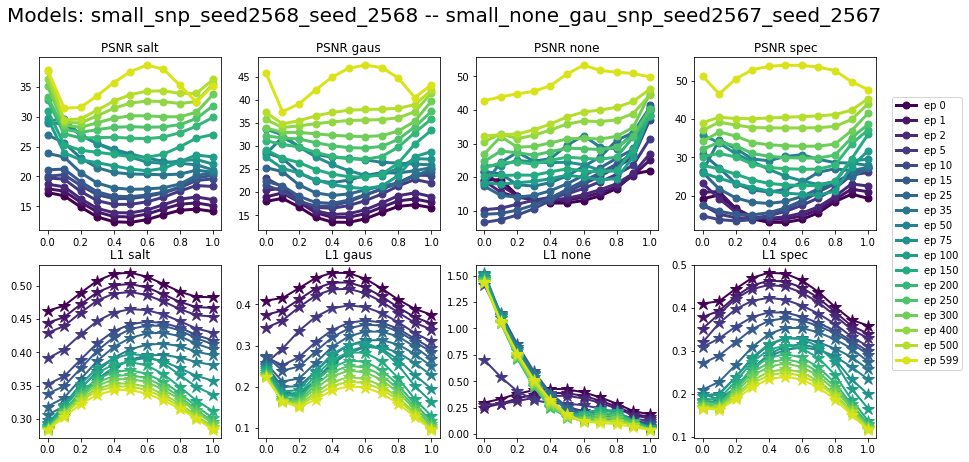

*****small_none_seed_2567*****


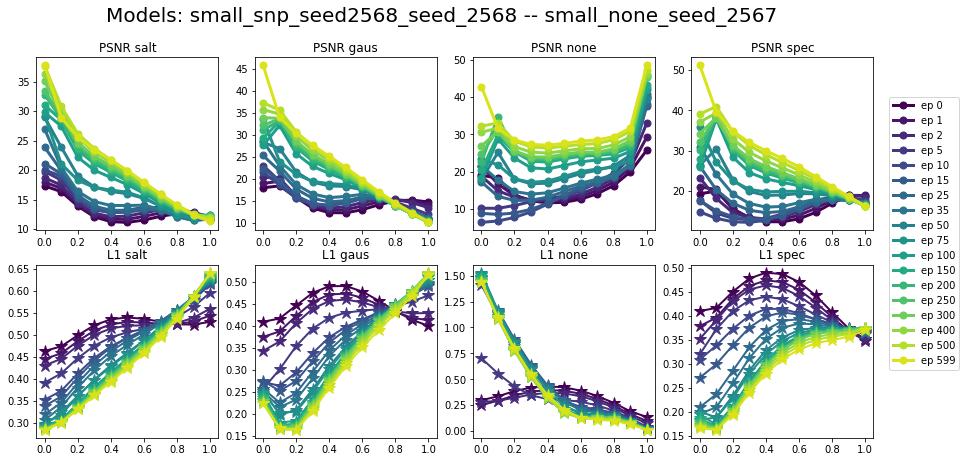

*****small_gau_seed2567_seed_2567*****


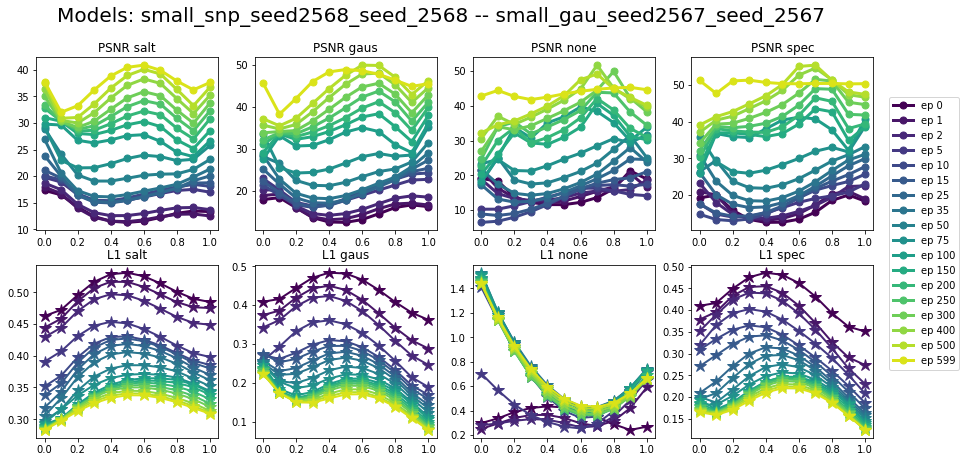

*****small_none_gau_snp_seed2568_seed_2568*****


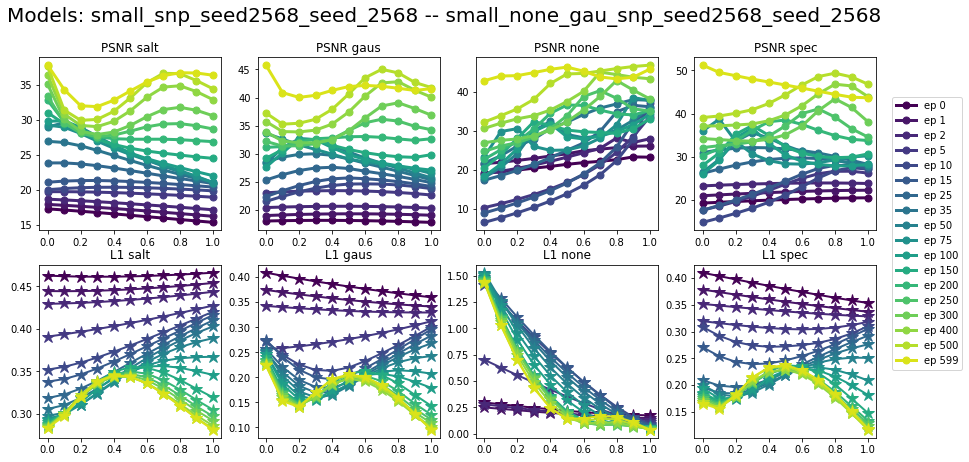

*****small_none_seed_2568_seed_2568*****


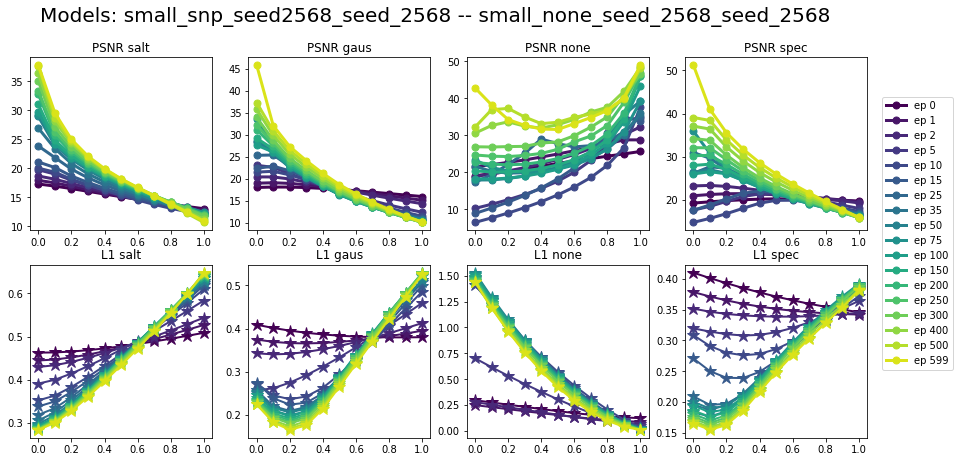

In [69]:
# Scrap the results and create all the appropriate plots
results_dir = '/home/thymios/approx_ensembles_log/interpolation_results/'
all_first_endpoints = os.listdir(results_dir)
interpolation_points = np.arange(0., 1.01, 0.1).tolist()

def plot_for_endpoints(task_results_dirs, models=['', '']):
    fontsize=20
    n_tasks = len(task_results_dirs)
    fig, ax = plt.subplots(2, n_tasks, figsize=(15, 7))
#     fig, ax = plt.subplots(1, 2, figsize=(15, 7))

    cnt = 0
    cmap = matplotlib.cm.get_cmap('viridis')

    for task, task_dir in task_results_dirs.items():
        epochs_dirs = os.listdir(task_dir)
        n_epochs = len(epochs_dirs)
        for k, epoch_name in enumerate(
            sorted(epochs_dirs, key=lambda x: int(x.split('.pkl')[0].split('_')[-1]))):
            epoch_cnt = int(epoch_name.split('.pkl')[0].split('_')[-1])
            result_dic = joblib.load(os.path.join(task_dir, epoch_name))
            
            x = interpolation_points
            ax[0, cnt].plot(x, [result_dic[i]['PSNR'].clip(upper=60).mean() for i in interpolation_points],
                     marker='o',
                       markersize=7,
                       linewidth=3, color = cmap( (k) / ( n_epochs) ),
                     linestyle='-', label='ep {}'.format(epoch_cnt))
            ax[1, cnt].plot(x, [result_dic[i]['L1'].mean() for i in interpolation_points],
                     marker='*',
                       markersize=12,
                       linewidth=2, color = cmap( (k) / ( n_epochs) ),
                     linestyle='-', label='ep {}'.format(epoch_cnt))
            ax[0, cnt].set_title('PSNR {}'.format(task[:4]))
            ax[1, cnt].set_title('L1 {}'.format(task[:4]))
        cnt += 1
#             ax[0].plot(x, [result_dic[i]['PSNR'].clip(upper=60).mean() for i in interpolation_points],
#                      marker='o',
#                        markersize=7,
#                        linewidth=3,
#                      linestyle='-', label='ep {}'.format(epoch_cnt))
#             ax[1].plot(x, [result_dic[i]['L1'].mean() for i in interpolation_points],
#                      marker='*',
#                        markersize=12,
#                        linewidth=2,
#                      linestyle='-', label='ep {}'.format(epoch_cnt))
#             ax[0].set_title('PSNR {}'.format(task[:0]))
#             ax[1].set_title('L1 {}'.format(task[:0]))
#         break
    plt.suptitle('Models: {} -- {}'.format(models[0], models[1]), fontsize=fontsize)
    lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
    lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
    lines, labels = zip(*sorted(zip(lines, labels), key = lambda x: int(x[-1].split(' ')[-1])))
    plt.legend(lines[::2*n_tasks], labels[::2*n_tasks], bbox_to_anchor=[0, 0, 1.5, 2])
#     plt.legend(lines[::2], labels[::2], bbox_to_anchor=[0, 0, 1, 1])

    plt.show()


for first_model in all_first_endpoints:
    print('='*10 + first_model + '='*10)
    first_model_dir = os.path.join(results_dir, first_model)
    second_models = os.listdir(first_model_dir)
    for second_model in second_models:
        second_model_dir = os.path.join(first_model_dir, second_model)
        print('*'*5 + second_model + '*'*5)
        # Gather results form all tasks
        tasks_names = os.listdir(second_model_dir)
        task_results_dirs = dict(
            [(t, os.path.join(second_model_dir, t))
             for t in tasks_names])
        plot_for_endpoints(task_results_dirs, models=[first_model, second_model])

# 

==========small_gau_seed2568_seed_2568==========
*****small_gau_snp_seed2568_seed_2568*****


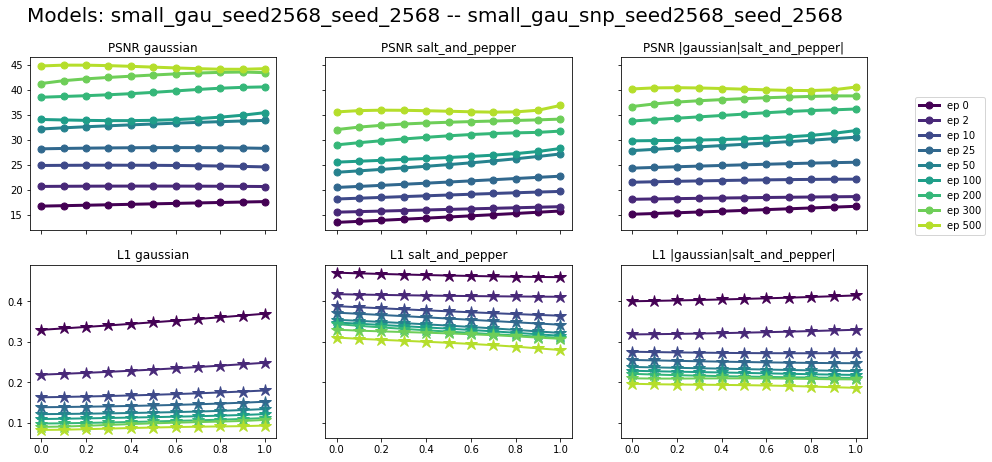

*****small_gau_snp_seed2567_seed_2567*****


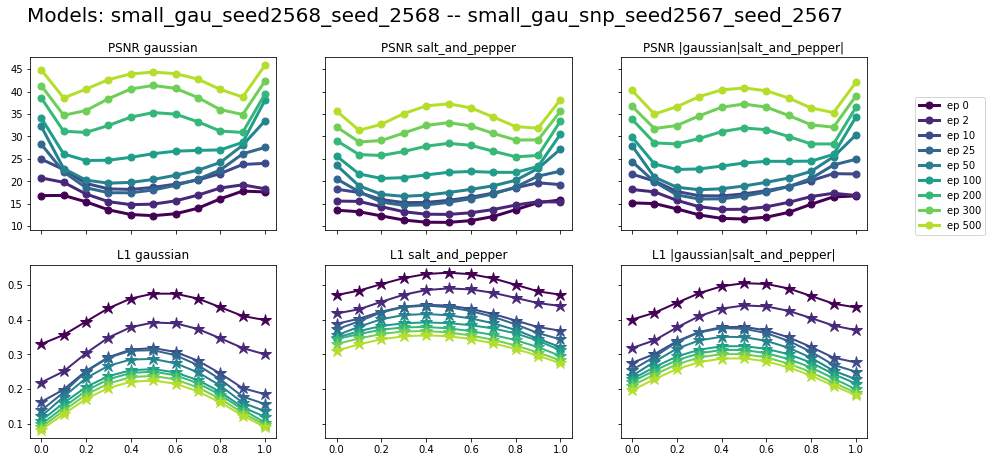

*****small_snp_seed2567_seed_2567*****


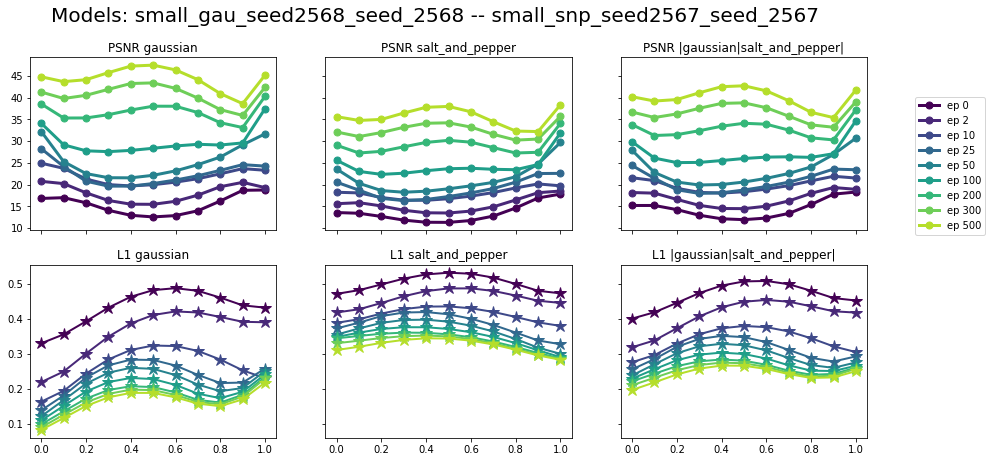

*****small_none_gau_snp_seed2567_seed_2567*****


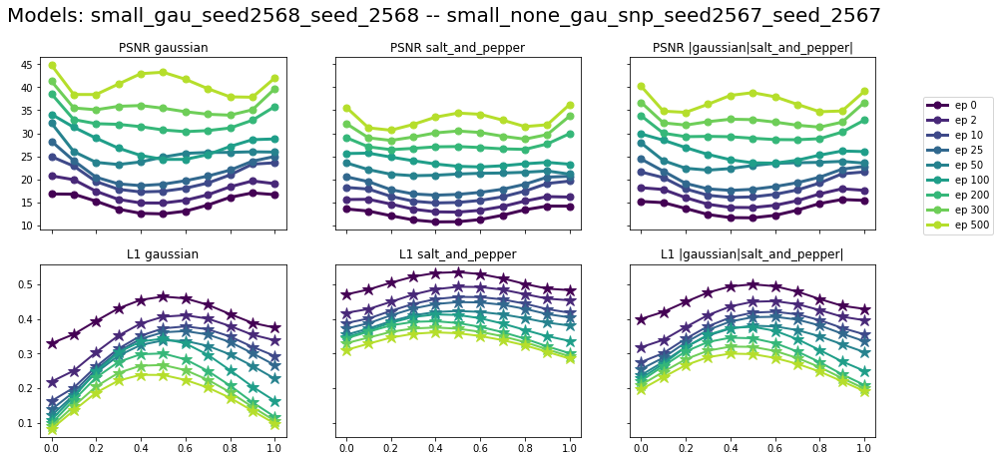

*****small_none_seed_2567*****


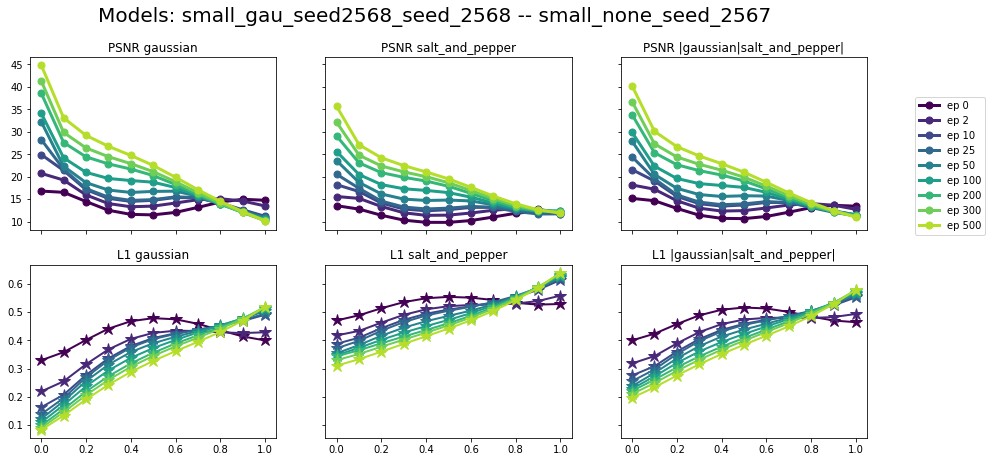

*****small_gau_seed2567_seed_2567*****


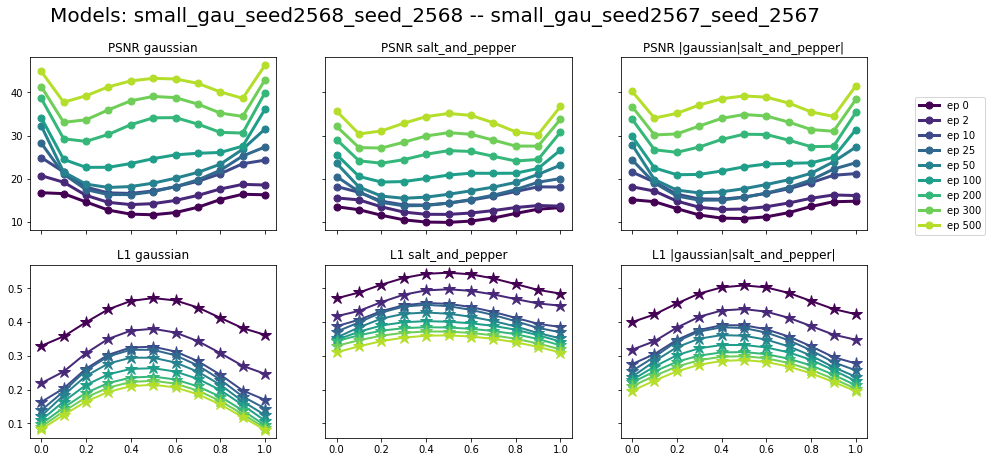

*****small_none_gau_snp_seed2568_seed_2568*****


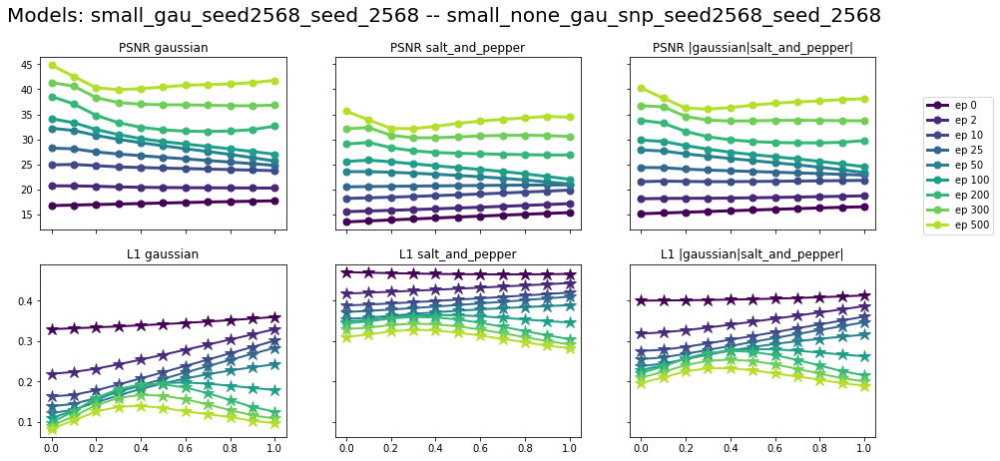

*****small_snp_seed2568_seed_2568*****


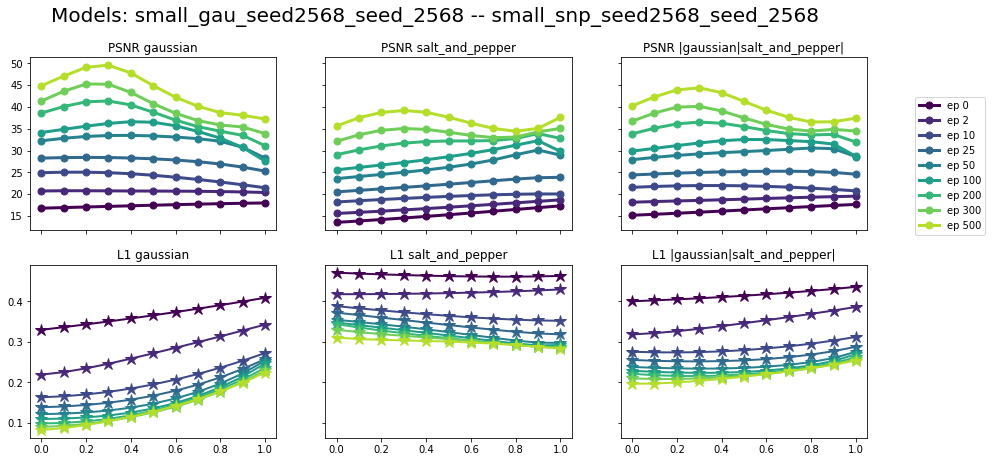

*****small_none_seed_2568_seed_2568*****


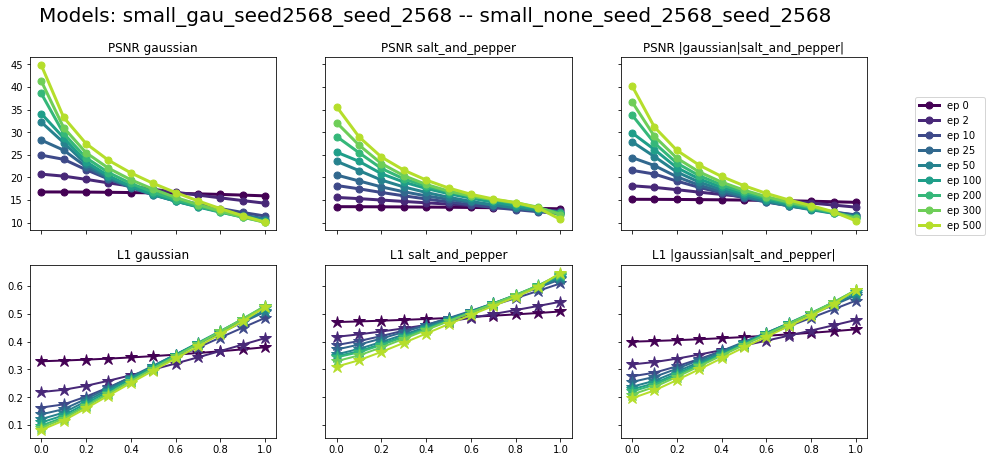

==========big_gau_seed_2568==========
*****big_snp_seed_2567*****


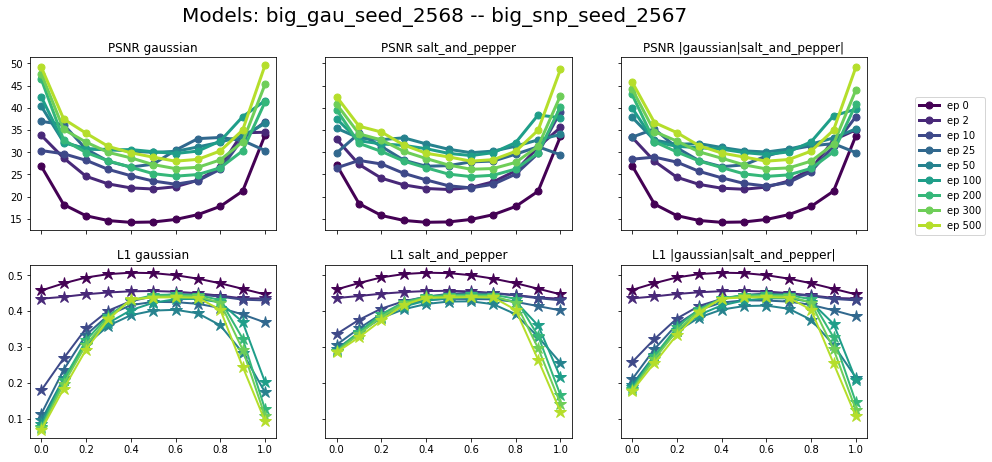

*****big_none_gau_snp_seed_2568*****


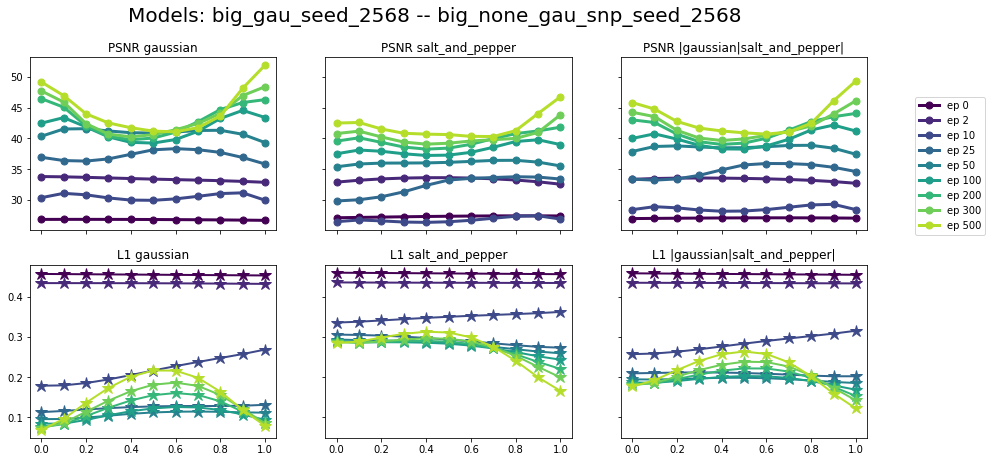

*****big_gau_snp_seed_2567*****


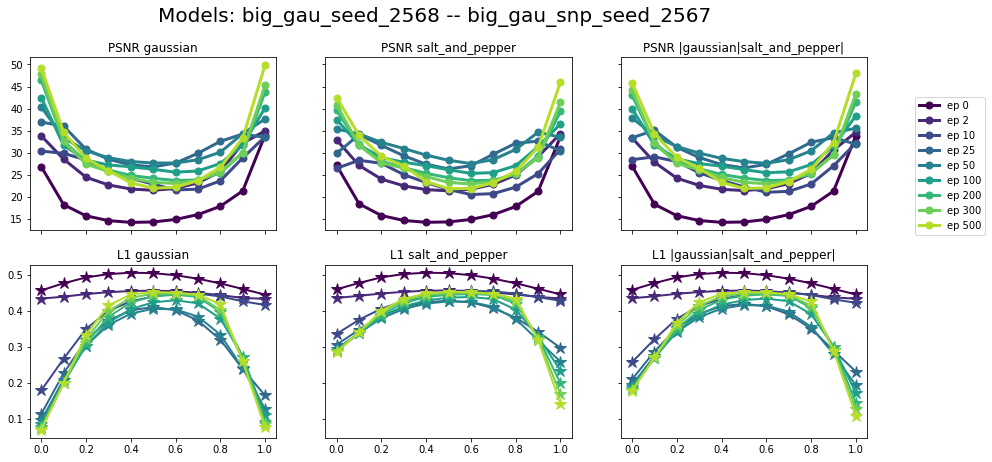

*****big_none_seed_2567*****


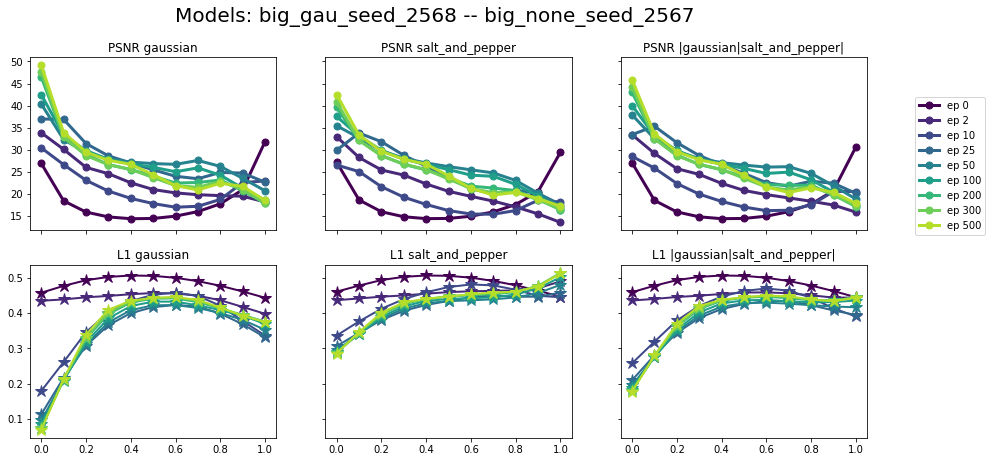

*****big_gau_snp_seed_2568*****


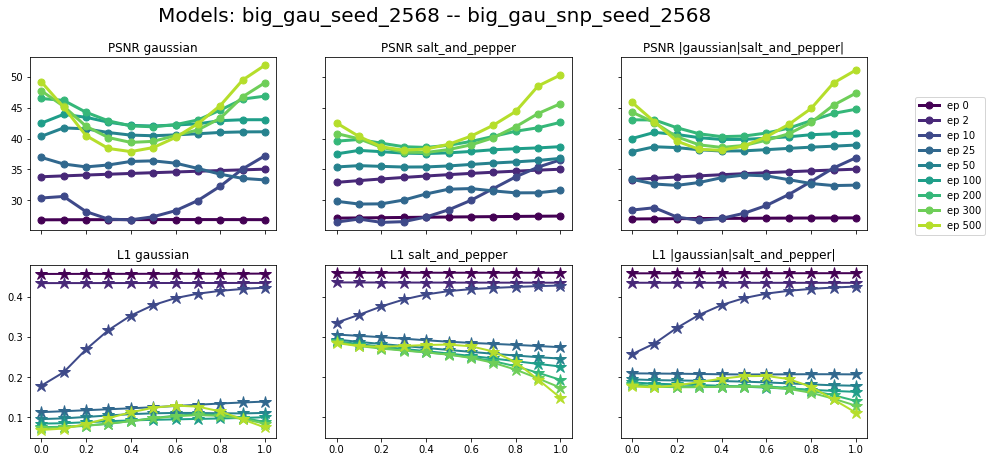

*****big_none_gau_snp_seed_2567*****


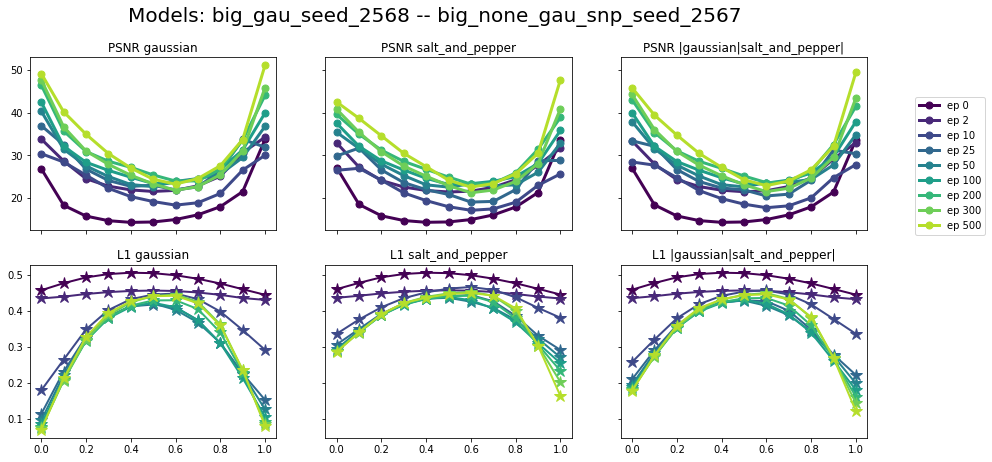

*****big_none_seed_2568*****


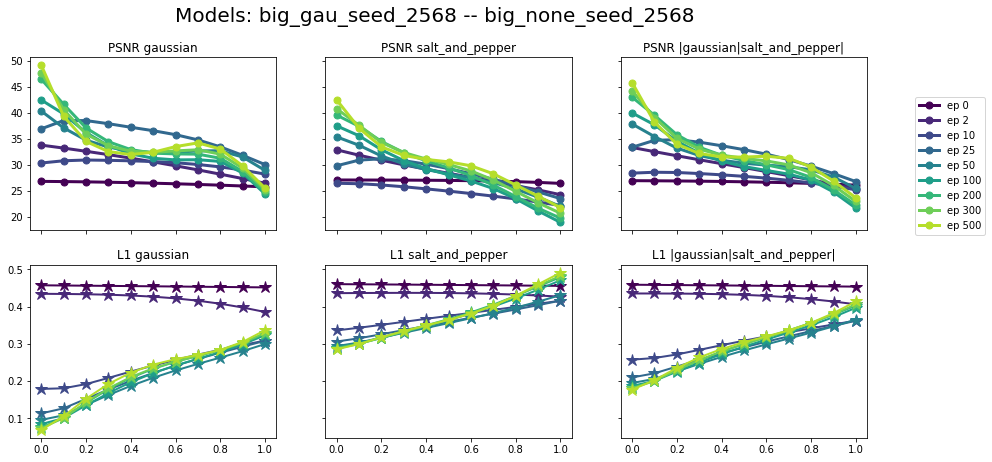

*****big_gau_seed_2567*****


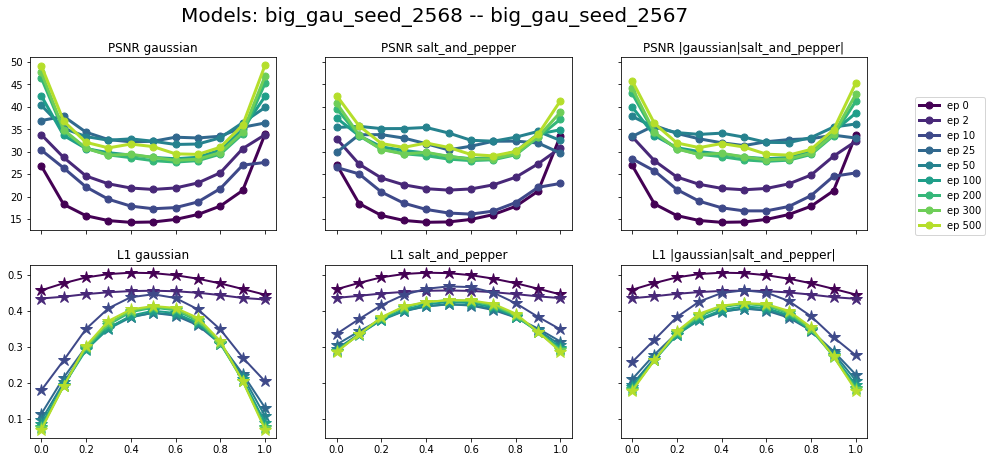

*****big_snp_seed_2568*****


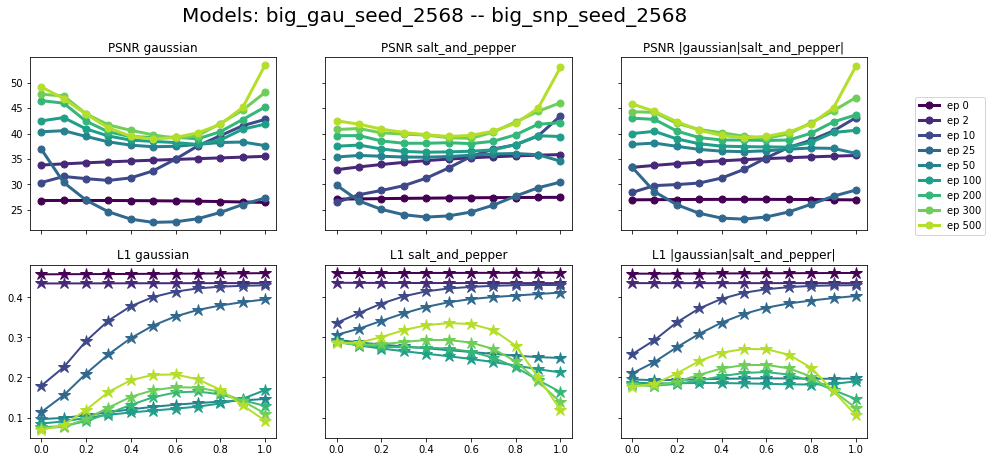

==========big_snp_seed_2568==========
*****big_gau_seed_2568*****


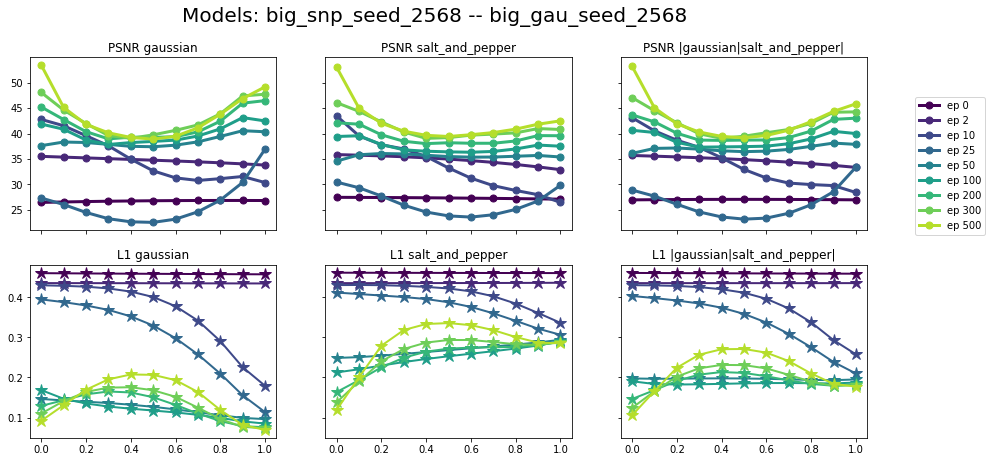

*****big_snp_seed_2567*****


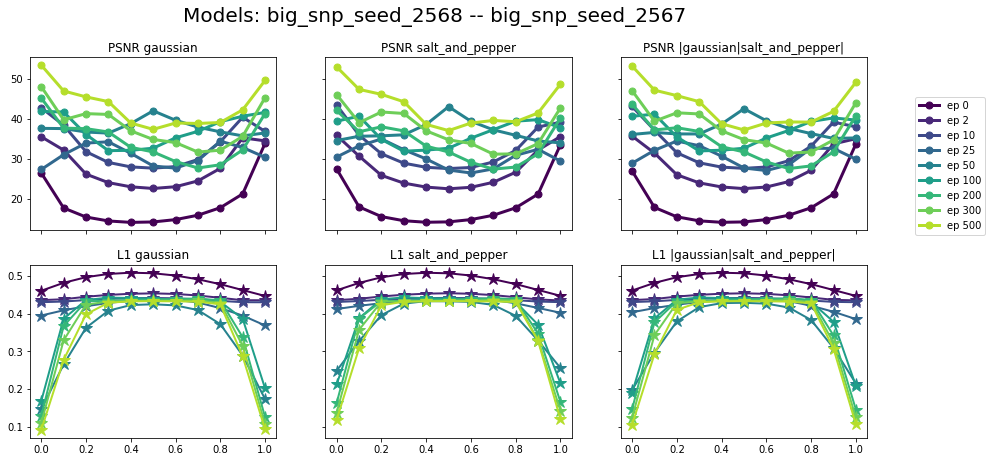

*****big_none_gau_snp_seed_2568*****


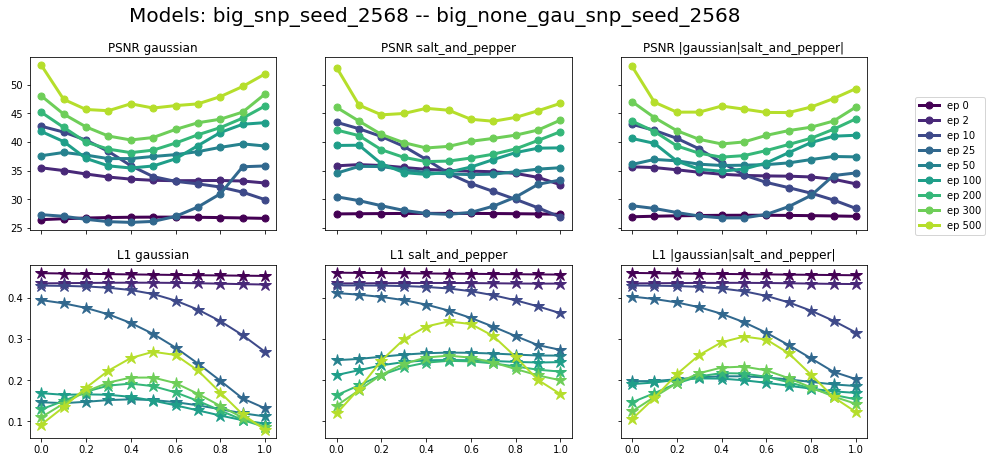

*****big_gau_snp_seed_2567*****


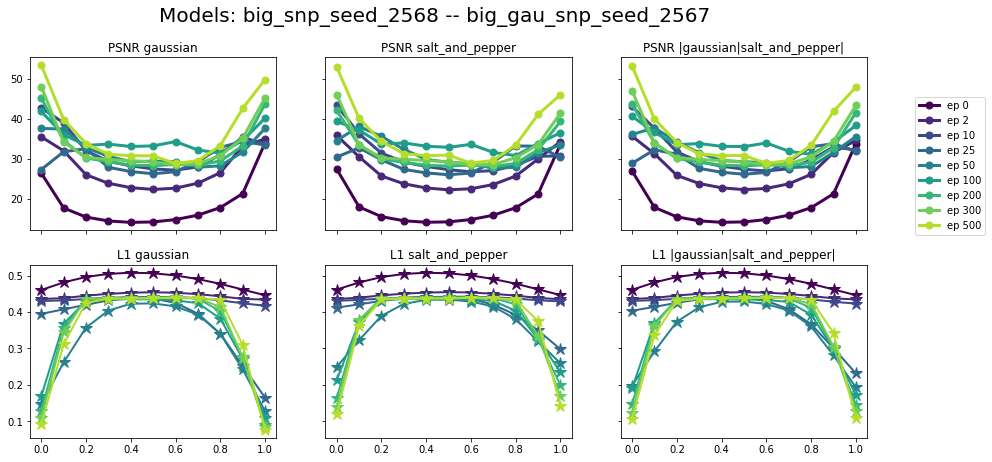

*****big_none_seed_2567*****


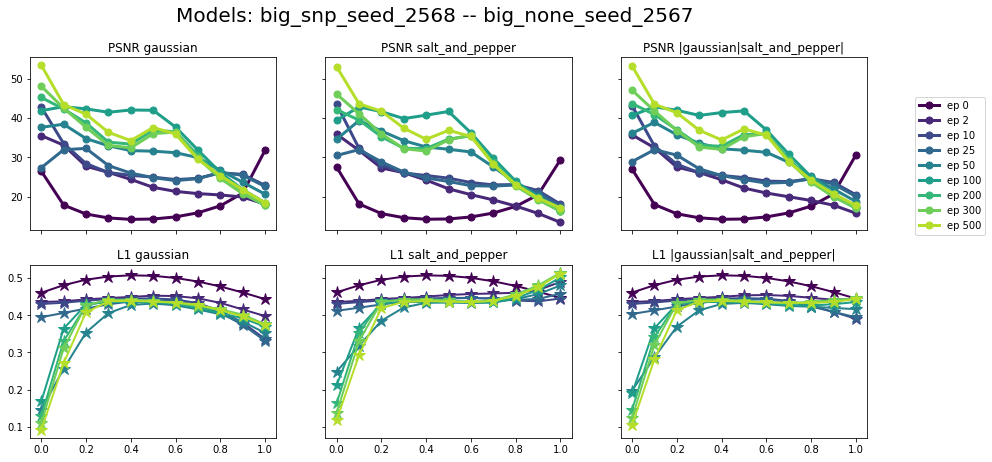

*****big_gau_snp_seed_2568*****


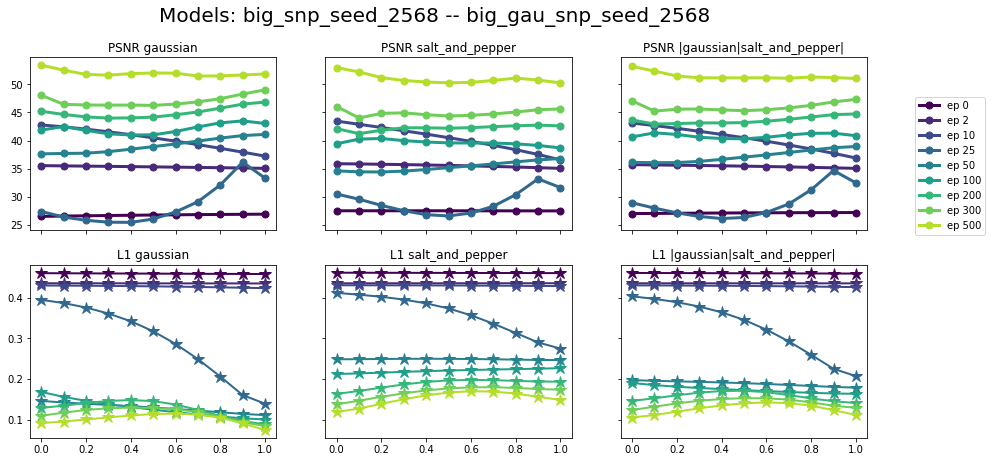

*****big_none_gau_snp_seed_2567*****


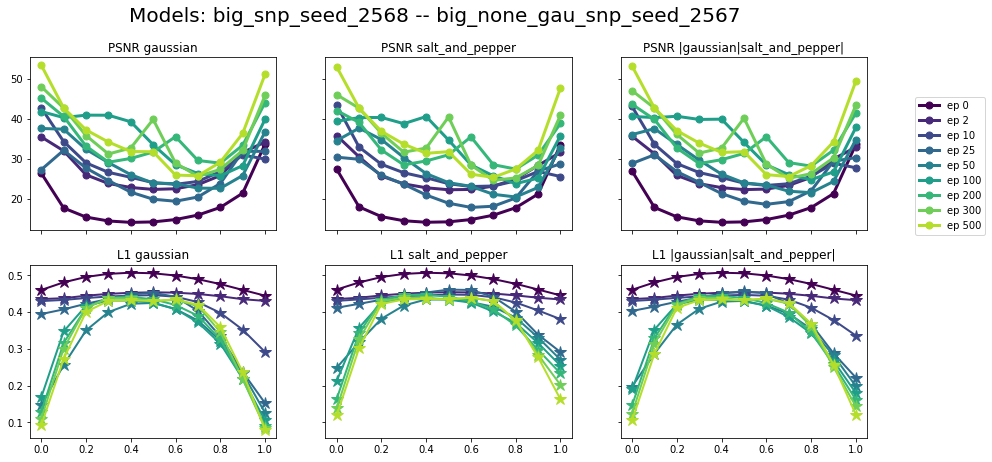

*****big_none_seed_2568*****


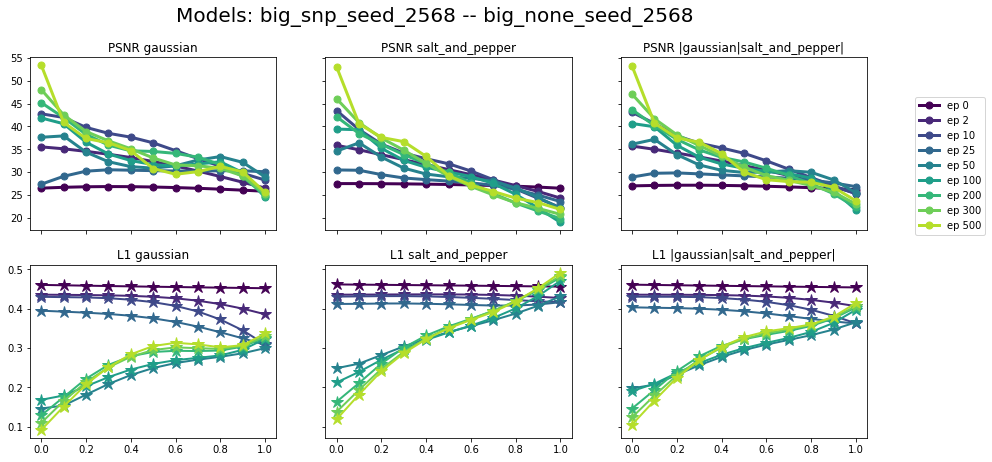

*****big_gau_seed_2567*****


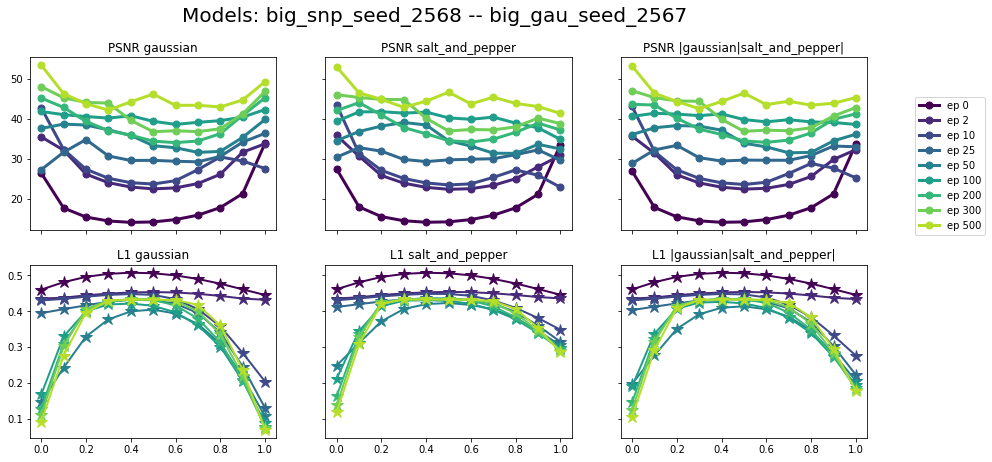

==========small_snp_seed2568_seed_2568==========
*****small_gau_seed2568_seed_2568*****


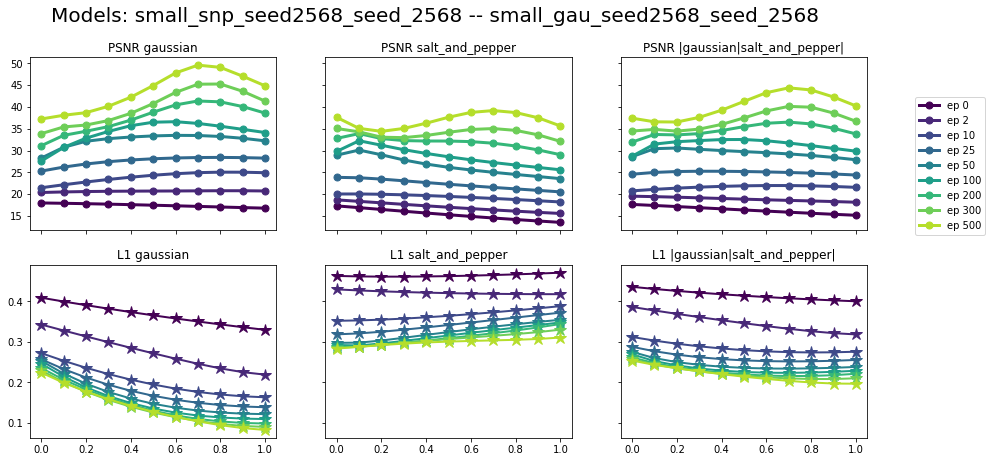

*****small_gau_snp_seed2568_seed_2568*****


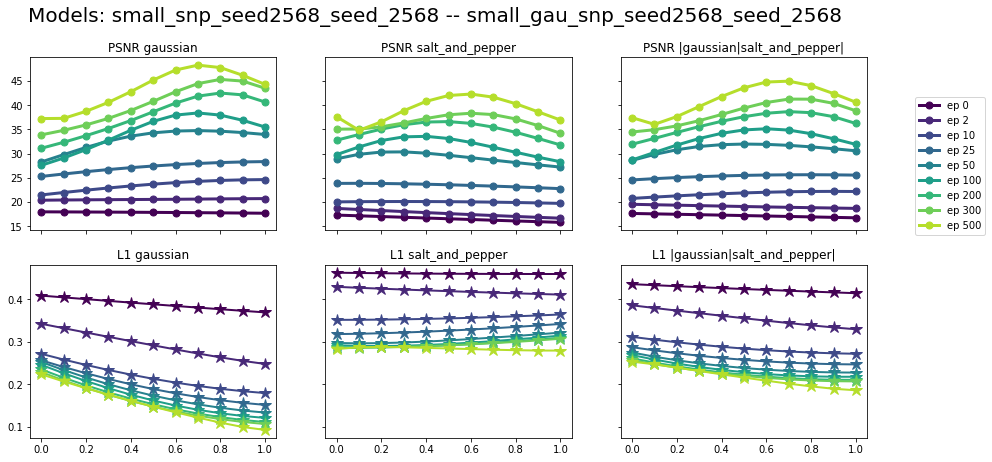

*****small_gau_snp_seed2567_seed_2567*****


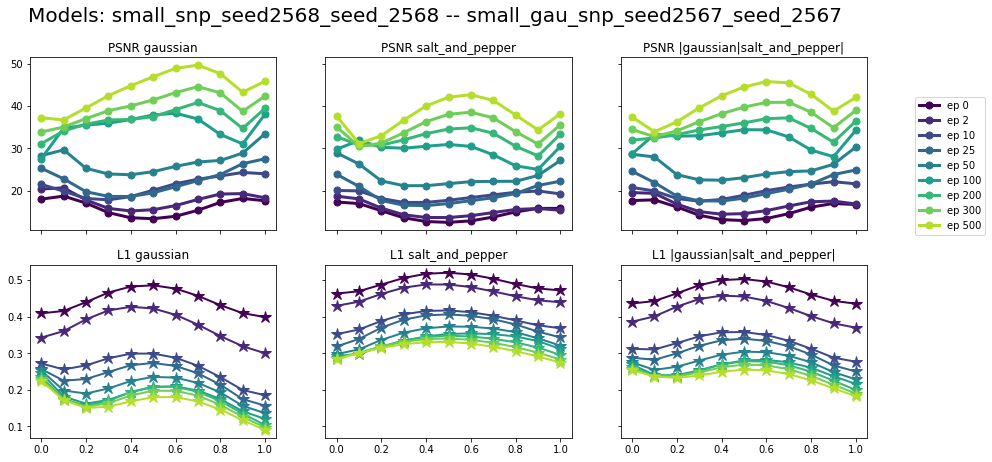

*****small_snp_seed2567_seed_2567*****


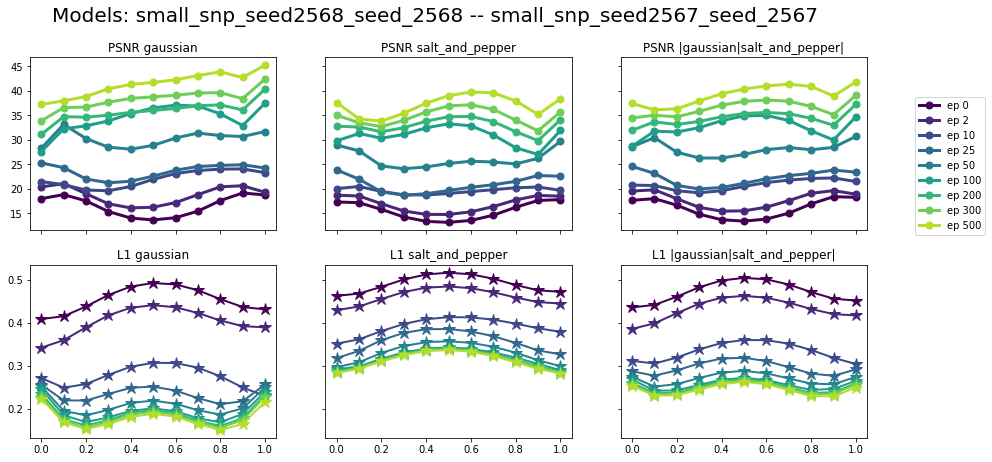

*****small_none_gau_snp_seed2567_seed_2567*****


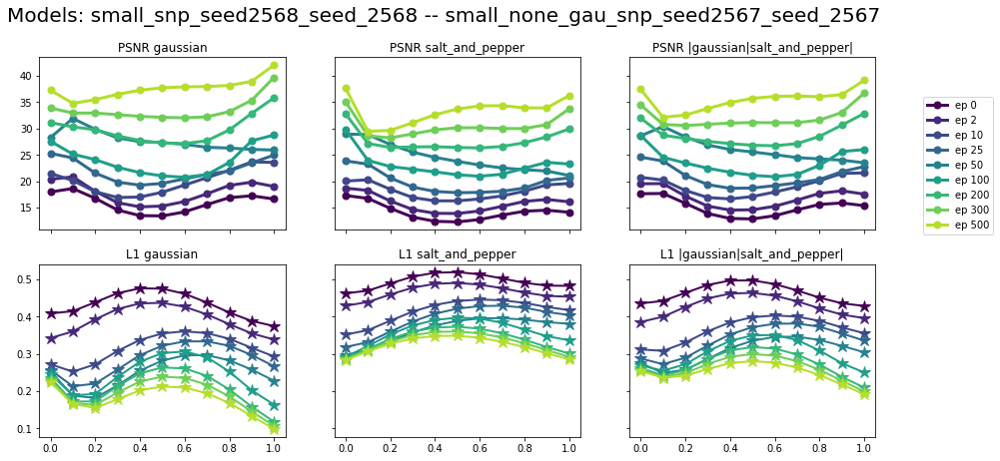

*****small_none_seed_2567*****


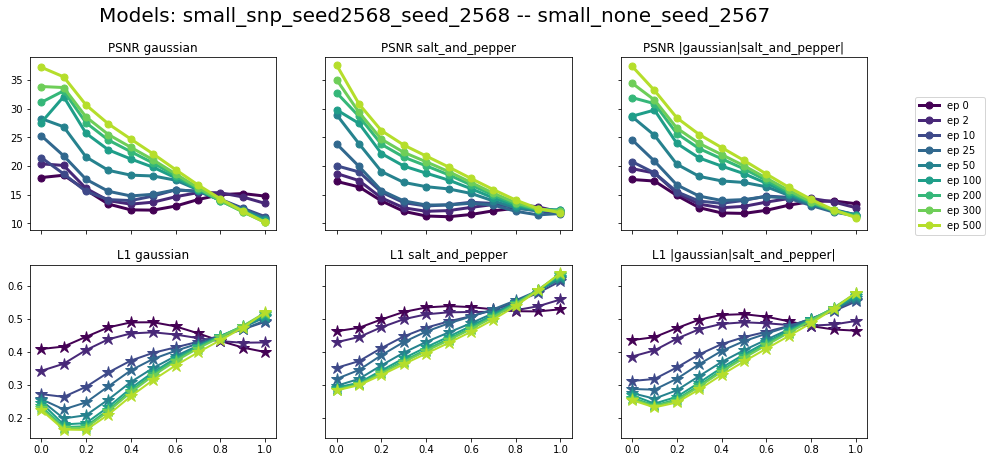

*****small_gau_seed2567_seed_2567*****


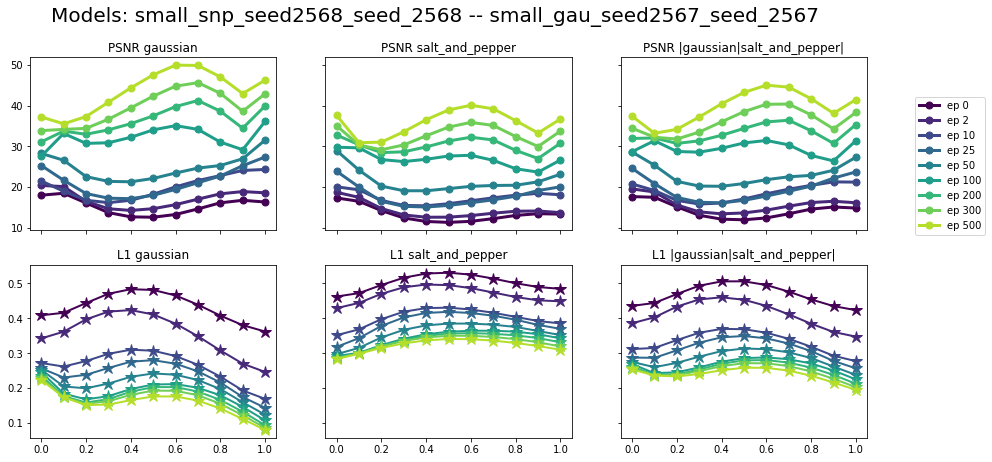

*****small_none_gau_snp_seed2568_seed_2568*****


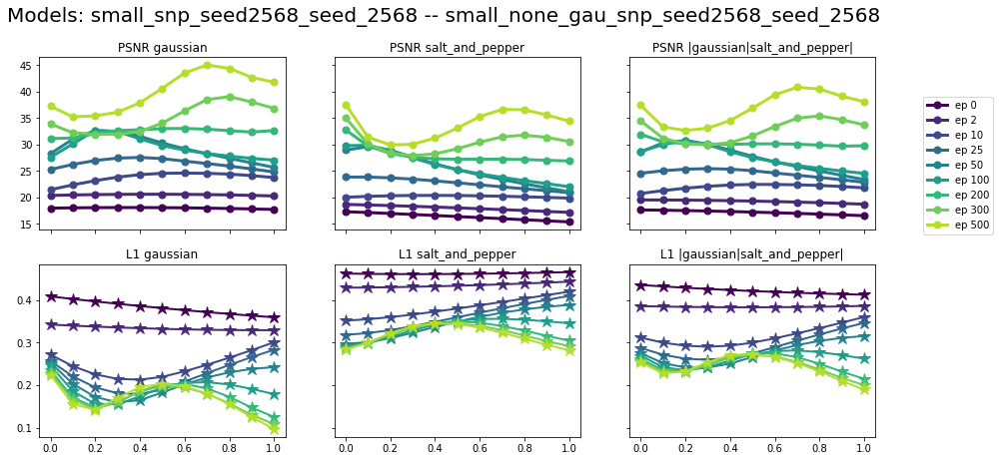

*****small_none_seed_2568_seed_2568*****


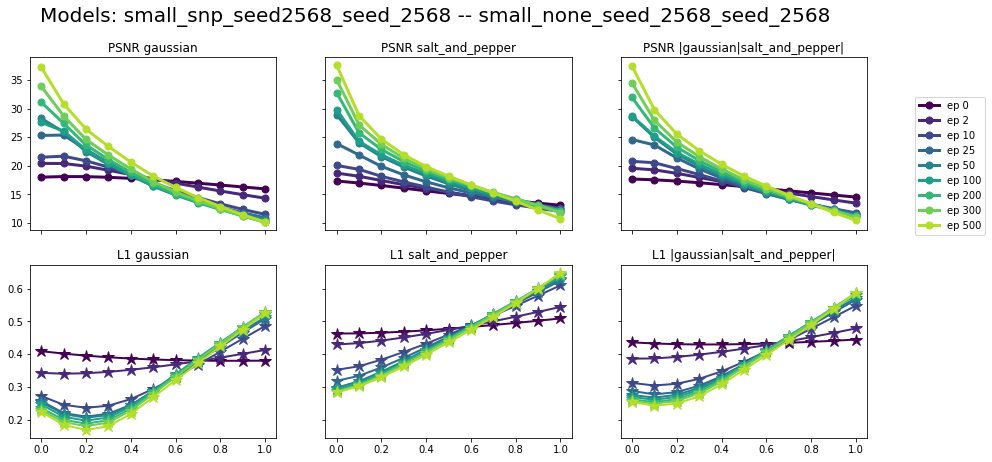

In [88]:
# Plot specifically for the multitask
def plot_for_endpoints_multitask(task_results_dirs, models=['', '']):
    fontsize=20
    interpolation_points = np.arange(0., 1.01, 0.1).tolist()
    n_tasks = len(task_results_dirs)
    fig, ax = plt.subplots(2, n_tasks, sharey='row', sharex='col', figsize=(15, 7))
    cnt = 0
    cmap = matplotlib.cm.get_cmap('viridis')

    for task, task_dir in task_results_dirs.items():
        new_task_dir = task_dir
        if '|' in task:
            new_task_dir =  ''.join([task_dir.split('|')[0], task_dir.split('|')[1]])
        epochs_dirs = os.listdir(new_task_dir)
        n_epochs = len(epochs_dirs) // 2
        for k, epoch_name in enumerate(
            sorted(epochs_dirs, key=lambda x: int(x.split('.pkl')[0].split('_')[-1]))[::2]):
            epoch_cnt = int(epoch_name.split('.pkl')[0].split('_')[-1])
            if '|' in task:
                subtasks = task.split('|')[1:-1]
                y0 = [0. for _ in interpolation_points]
                y1 = [0. for _ in interpolation_points]
                for subtask in subtasks:
                    result_dic = joblib.load(os.path.join(
                        ''.join([task_dir.split('|')[0], subtask]), epoch_name))
                    for interp_idx, i in enumerate(interpolation_points):
                        y0[interp_idx] += result_dic[i]['PSNR'].clip(upper=60).mean() / len(subtasks)
                        y1[interp_idx] += result_dic[i]['L1'].mean() / len(subtasks)
            else:
                result_dic = joblib.load(os.path.join(task_dir, epoch_name))
                y0 = [result_dic[i]['PSNR'].clip(upper=60).mean() for i in interpolation_points]
                y1 = [result_dic[i]['L1'].mean() for i in interpolation_points]
            
            x = interpolation_points
            ax[0, cnt].plot(x, y0,
                     marker='o',
                       markersize=7,
                       linewidth=3, color = cmap( (k) / ( n_epochs) ),
                     linestyle='-', label='ep {}'.format(epoch_cnt))
            ax[1, cnt].plot(x, y1,
                     marker='*',
                       markersize=12,
                       linewidth=2, color = cmap( (k) / ( n_epochs) ),
                     linestyle='-', label='ep {}'.format(epoch_cnt))
            ax[0, cnt].set_title('PSNR {}'.format(task))
            ax[1, cnt].set_title('L1 {}'.format(task))
        cnt += 1
    plt.suptitle('Models: {} -- {}'.format(models[0], models[1]), fontsize=fontsize)
    lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
    lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
    lines, labels = zip(*sorted(zip(lines, labels), key = lambda x: int(x[-1].split(' ')[-1])))
    plt.legend(lines[::2*n_tasks], labels[::2*n_tasks], bbox_to_anchor=[0, 0, 1.5, 2])
#     plt.legend(lines[::2], labels[::2], bbox_to_anchor=[0, 0, 1, 1])

    plt.show()


for first_model in all_first_endpoints:
    print('='*10 + first_model + '='*10)
    first_model_dir = os.path.join(results_dir, first_model)
    second_models = os.listdir(first_model_dir)
    for second_model in second_models:
        second_model_dir = os.path.join(first_model_dir, second_model)
        print('*'*5 + second_model + '*'*5)
        # Gather results from all tasks
#         tasks_names = os.listdir(second_model_dir)
        tasks_names = ['gaussian', 'salt_and_pepper', '|gaussian|salt_and_pepper|']
        task_results_dirs = dict(
            [(t, os.path.join(second_model_dir, t))
             for t in tasks_names])
        plot_for_endpoints_multitask(task_results_dirs, models=[first_model, second_model])

In [97]:
# Create plot for the interpolated plane
bs = 512
num_workers = 8
def _init_fn(worker_id):
    np.random.seed(13)

val_noise_types = ['none', 'salt_and_pepper', 'gaussian', 'speckle']
val_generators = dict(
    [(n, DataLoader(NoisyMNIST([n], train=False),
                    batch_size=bs, shuffle=False, 
                    num_workers=num_workers,   pin_memory=True, worker_init_fn=_init_fn
                    ))
     for n in val_noise_types])

print(val_generators)

# Helper functions for evaluating a model ensemble in parameter space
def run_model_on_data(model, data_gen):
    results_dic = {}
    model.cuda()
    model.eval()
    eval_dfs = []
    with torch.no_grad():
#         for (clean, noisy, labels, this_noise_type) in tqdm(data_gen, desc='Test'):
        for (clean, noisy, labels, this_noise_type) in data_gen:
            clean, noisy = clean.cuda(), noisy.cuda()
            pred = model(noisy)
            mse = torch.abs(clean - pred) ** 2
            l1 = torch.abs(clean - pred)
            psnr = 10 * torch.log10(1. / (mse + 1e-16))
            
            psnr_df = pd.DataFrame(psnr.mean([-1, -2, -3]).detach().cpu(), columns=['PSNR'])
            l1_df = pd.DataFrame(l1.mean([-1, -2, -3]).detach().cpu(), columns=['L1'])
            labels_df = pd.DataFrame(labels, columns=['labels'])
            concatenated_df = pd.concat([psnr_df, labels_df, l1_df], axis=1, join='outer')
            eval_dfs.append(concatenated_df)
    
    return pd.concat(eval_dfs)

def infer_checkpoint_path(model_name, epoch_count):
    model_dirpath = os.path.join(MNIST_LOG_PATH, model_name)
    checkpoint_path = os.path.join(model_dirpath, 'chckpt_ep_{}.pt'.format(str(epoch_count)))
    return checkpoint_path


def get_model(model_name, epoch_cnt, gpu_ids):
    os.environ['CUDA_VISIBLE_DEVICES'] = ','.join([str(cad) for cad in gpu_ids])
    checkpoint_path = infer_checkpoint_path(model_name, epoch_cnt)
    if 'small' in model_name:
        model = MNISTnet(n_intermediate_layers=0)
    elif 'big' in model_name:
        model = MNISTnet(n_intermediate_layers=4)
    else:
        raise ValueError('Cannot understand the number of layers')
    model = nn.DataParallel(model)
    model.load_state_dict(torch.load(checkpoint_path))
    return model

# def create_new_interpolated_model(new_model, [model1, model2], [alphas]):
#     for i, layer in enumerate(model1.module.convs):
#         if hasattr(layer, 'weight'):
#             new_model.module.convs[i].weight = torch.nn.parameter.Parameter(
#                 alpha * model2.module.convs[i].weight +
#                 (1. - alpha) * model1.module.convs[i].weight)
#         if hasattr(layer, 'bias'):
#             new_model.module.convs[i].bias = torch.nn.parameter.Parameter(
#                 alpha * model2.module.convs[i].bias +
#                 (1. - alpha) * model1.module.convs[i].bias)
#     return new_model

# def fetch_and_eval_interpolated_checkpoints_on_data(
#     model_name_1 = 'small_snp_seed2568_seed_2568',
#     model_name_2 = 'small_gau_seed2568_seed_2568',
#     epoch_cnt_1 = 150, epoch_cnt_2 = 0, gpu_ids = [0], data_gen=None,
#     interpolation_points=[]):
    
#     model1 = get_model(model_name_1, epoch_cnt_1, gpu_ids)
#     model2 = get_model(model_name_2, epoch_cnt_2, gpu_ids)
#     new_model = get_model(model_name_1, epoch_cnt_1, gpu_ids)
    
#     result_dic = {}
#     for alpha in interpolation_points:
#         new_model = create_new_interpolated_model(new_model, model1, model2, alpha)
#         eval_df = run_model_on_data(new_model, data_gen)
#         result_dic[alpha] = eval_df
#     return result_dic



# Build the meshgrid for the plane connecting those 3 n-dimensional points
print(model_1)

{'none': <torch.utils.data.dataloader.DataLoader object at 0x7f9a5d8f6bd0>, 'salt_and_pepper': <torch.utils.data.dataloader.DataLoader object at 0x7f9a5d8f26d0>, 'gaussian': <torch.utils.data.dataloader.DataLoader object at 0x7f9a5ee39810>, 'speckle': <torch.utils.data.dataloader.DataLoader object at 0x7f9a5d854750>}


FileNotFoundError: [Errno 2] No such file or directory: '/home/thymios/approx_ensembles_log/mnist/big_mosreepochs_gau_snp_seed_2568/chckpt_ep_0.pt'

100%|██████████| 15/15 [00:00<00:00, 586.74it/s]


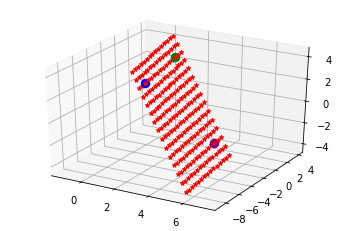

In [230]:
from mpl_toolkits.mplot3d import Axes3D # <--- This is important for 3d plotting 


x = np.array([1., 2, 3])
y = np.array([0 , 0, 1])
z = np.array([6 , -5, -1])

xy = y - x
projz = np.dot(xy, z) / np.dot(xy, xy) * xy
vertz = z - projz
normal = np.cross(xy, z)
xz = z-x

dxy = 0.1
dxz = 0.1

margin = 0.1

def interpolate_3points(t1, t2, points):
    return points[0] + t1 * (points[1] - points[0]) + t2 * (points[2] - points[0])


# new = (xx * xy + x) 

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# x = np.arange(xmin, xmax+dx, dx)
# z = np.arange(zmin, zmax+dz, dz)
# X, Z = np.meshgrid(x, z)
# ts = np.arange(0, 1.01, 0.1)
# y * ts + (1. - ts) * x
# new = () / normal[-1]
# ax.plot(ts, new)
# Ensure that the next plot doesn't overwrite the first plot
# ax = plt.gca()
# plt.hold(True)

ax.scatter(x[0], x[1], x[2], color='green', linewidth=5)
ax.scatter(y[0], y[1], y[2], color='blue', linewidth=5)
ax.scatter(z[0], z[1], z[2], color='purple', linewidth=5)

for t_xy in t_xys:
    for t_xz in tqdm(t_xzs):
        new_point = interpolate_3points(t_xy, t_xz, [x, y, z])
        ax.scatter(*new_point.tolist(), color='red', marker='*')

plt.show()


In [233]:
# Gather results from the interpolated values
dxy = 0.1
dxz = 0.1
margin = 0.2
t_xys = np.arange(-margin, 1. + margin +dxy, dxy).tolist()
t_xzs = np.arange(-margin, 1. + margin +dxz, dxz).tolist()

model_name_1 = 'big_moreepochs_gau_seed_2568'
model_name_2 = 'big_moreepochs_snp_seed_2568'
model_name_multitask = 'big_moreepochs_gau_snp_seed_2568'

def create_new_3interpolated_model(new_model, model1, model2, model3, alpha1, alpha2):
    for i, layer in enumerate(model1.module.convs):
        if hasattr(layer, 'weight'):
            new_model.module.convs[i].weight = torch.nn.parameter.Parameter(
                model1.module.convs[i].weight + 
                alpha1 * (model2.module.convs[i].weight - model1.module.convs[i].weight) +
                alpha2 * (model3.module.convs[i].weight - model1.module.convs[i].weight)) 
        if hasattr(layer, 'bias'):
            new_model.module.convs[i].bias = torch.nn.parameter.Parameter(
                model1.module.convs[i].bias + 
                alpha1 * (model2.module.convs[i].bias - model1.module.convs[i].bias) +
                alpha2 * (model3.module.convs[i].bias - model1.module.convs[i].bias))
    return new_model

interp_loss_results = {}

for epoch_cnt in [0, 25, 100, 500]:
    interp_loss_results[epoch_cnt] = {}
    model_1 = get_model(model_name_1, epoch_cnt, [0])
    model_2 = get_model(model_name_2, epoch_cnt, [0])
    model_multitask = get_model(model_name_multitask, epoch_cnt, [0])
    for task in ['gaussian', 'salt_and_pepper']:
        interp_loss_results[epoch_cnt][task] = {}
        for t_xy in t_xys:
            interp_loss_results[epoch_cnt][task][t_xy] = {}
            for t_xz in tqdm(t_xzs):
                new_model = get_model(model_name_multitask, 0, [0])
                new_model = create_new_3interpolated_model(
                    new_model, model_1, model_2, model_multitask, t_xy, t_xz)
                this_model_results = run_model_on_data(new_model, val_generators[task])
                interp_loss_results[epoch_cnt][task][t_xy][t_xz] = this_model_results.mean()
                

100%|██████████| 15/15 [00:22<00:00,  1.51s/it]


In [234]:
# save the results
joblib.dump(interp_loss_results, 'big_gau_snp_interp_results.pkl')
# interp_loss_results = joblib.load('big_gau_snp_interp_results.pkl')

['big_gau_snp_interp_results.pkl']

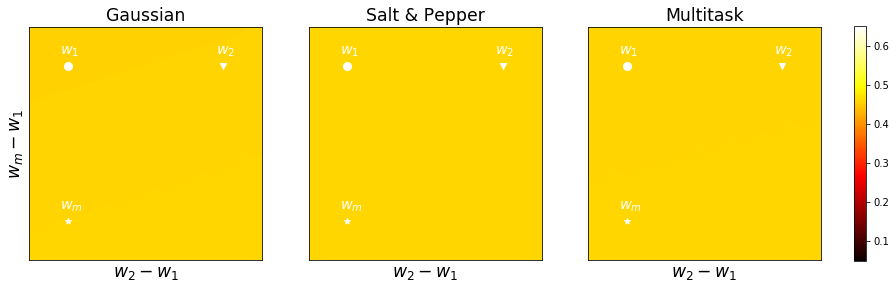

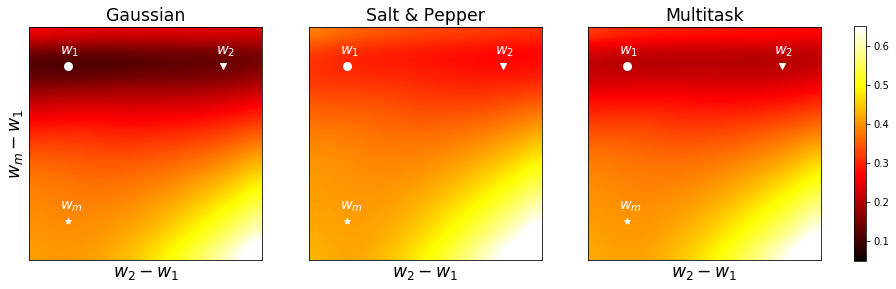

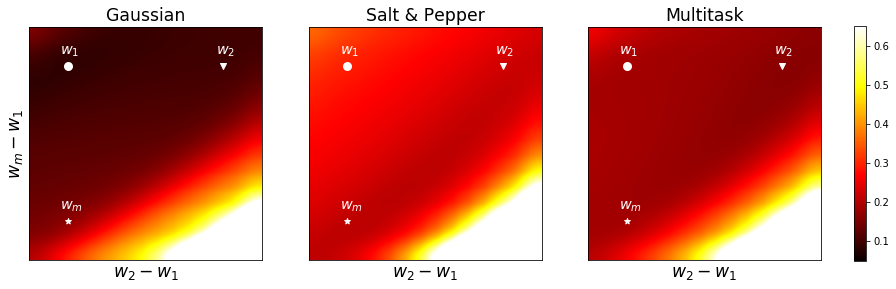

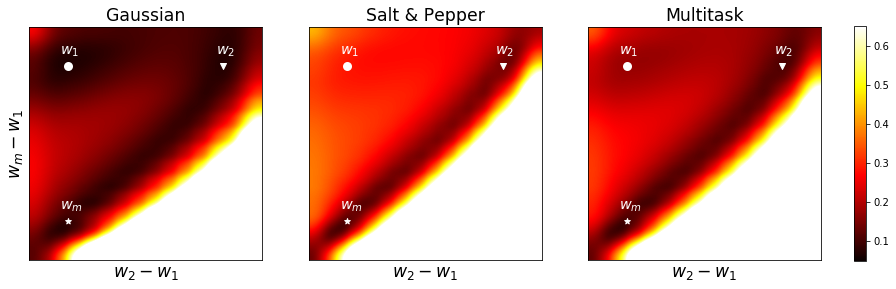

In [294]:
def plot_surface(surface, title):
    plt.imshow(surface, cmap=plt.cm.hot,
               interpolation='lanczos',
#                vmin=loss_mu_extent[0],
#                vmax=loss_mu_extent[1],
#                origin='lower',
#                extent=[t1[j, 0], t1[j, 1], t2[j, 0], t2[j, 1]]
              )
    
    dxy = 0.1
    dxz = 0.1
    margin = 0.2
    t_xys = np.arange(-margin, 1. + margin +dxy, dxy).tolist()
    t_xzs = np.arange(-margin, 1. + margin +dxz, dxz).tolist()
    
    plt.colorbar()
#     plt.colorbar(fraction=0.046, pad=0.04)
    plt.title(title, fontsize='xx-large')
    plt.xlabel(r'$w_2 - w_1$', fontsize='xx-large')
    plt.ylabel(r'$w_m - w_1$', fontsize='xx-large')
    plt.annotate(s=r'$w_1$', xy=(2, 2),
                 xytext=(1.5, 1.25),
                 color='white', fontsize='x-large')
    plt.annotate(s=r'$w_2$', xy=(surface.shape[1] - 2, surface.shape[1] - 2),
                 xytext=(12.5, 1.25),
                 color='white', fontsize='x-large')
    plt.annotate(s=r'$w_m$', xy=(2, surface.shape[1] - 2),
                 xytext=(1.5, 12.25),
                 color='white', fontsize='x-large')
    plt.scatter(2, 2, c='white', marker='o', linewidth=3)
    plt.scatter(surface.shape[1] - 2, 2, c='white', marker='v')
    plt.scatter(2, surface.shape[0] - 2, c='white', marker='*')
#     plt.xlim(-0.2, 1.2)
    plt.xticks([])
    plt.yticks([])

#     plt.xticks(range(-0.2, 1.3))
#     plt.yticks(range(-0.2, 1.3))
    plt.axis('tight')
    plt.show()
    

def plot_multiple_surfaces(surface_list, title):
    fig, ax = plt.subplots(1, len(surface_list), figsize=(15, 7), sharey=True)
    for i, surface in enumerate(surface_list):
        im = ax[i].imshow(surface, cmap=plt.cm.hot,
                       interpolation='lanczos',
                       vmin=0.05,
                       vmax=0.65,
        #                origin='lower',
        #                extent=[t1[j, 0], t1[j, 1], t2[j, 0], t2[j, 1]]
                      )

        dxy = 0.1
        dxz = 0.1
        margin = 0.2
        t_xys = np.arange(-margin, 1. + margin +dxy, dxy).tolist()
        t_xzs = np.arange(-margin, 1. + margin +dxz, dxz).tolist()

#         if i==2:
#             plt.colorbar()
#     #     plt.colorbar(fraction=0.046, pad=0.04)
        ax[i].set_xlabel(r'$w_2 - w_1$', fontsize='xx-large')
        color_name = 'white'
        if i == 0:
            ax[i].set_ylabel(r'$w_m - w_1$', fontsize='xx-large')
        ax[i].annotate(s=r'$w_1$', xy=(2, 2),
                     xytext=(1.5, 1.25),
                     color=color_name, fontsize='x-large')
        ax[i].annotate(s=r'$w_2$', xy=(surface.shape[1] - 2, surface.shape[1] - 2),
                     xytext=(11.5, 1.25),
                     color=color_name, fontsize='x-large')
        ax[i].annotate(s=r'$w_m$', xy=(2, surface.shape[1] - 2),
                     xytext=(1.5, 11.25),
                     color=color_name, fontsize='x-large')
        ax[i].scatter(2, 2, c=color_name, marker='o', linewidth=3)
        ax[i].scatter(surface.shape[1] - 3, 2, c=color_name, marker='v')
        ax[i].scatter(2, surface.shape[0] - 3, c=color_name, marker='*')
        ax[i].set_xticks([])
        ax[i].set_yticks([])

    ax[0].set_title('Gaussian', fontsize='xx-large')
    ax[1].set_title('Salt & Pepper', fontsize='xx-large')
    ax[2].set_title('Multitask', fontsize='xx-large')
#     plt.axis('tight')
    fig.colorbar(im, ax=ax.ravel().tolist(), fraction=0.014, pad=0.04)
    plt.show()


for epoch_cnt in [0, 25, 100, 500]:
    surface_list = []
    for task in ['gaussian', 'salt_and_pepper']:
        results = interp_loss_results[epoch_cnt][task]
        l1_loss_surface = np.zeros([len(t_xys), len(t_xzs)])
        psnr_loss_surface = np.zeros([len(t_xys), len(t_xzs)])
        for i, t_xy in enumerate(t_xys):
            for j, t_xz in enumerate(t_xzs):
                l1_loss_surface[i, j] = results[t_xy][t_xz]['L1']
                psnr_loss_surface[i, j] = results[t_xy][t_xz]['PSNR']
        surface_list.append(l1_loss_surface)
        
    # Compute the multitask loss surface
#     print(surface_list[0].shape)
#     print(surface_list[1].shape)
#     print(((surface_list[0] + surface_list[1]) / 2.).shape)
    surface_list.append(((surface_list[0] + surface_list[1])/ 2.))
    plot_multiple_surfaces(surface_list,
                           'Epoch: {} Loss: {}'.format(epoch_cnt, 'L1'))
            
#         title = 'Task: {} Epoch: {} Loss: {}'.format(task, epoch_cnt, 'L1')
#         plot_surface(l1_loss_surface, title)
#         title = 'Task: {} Epoch: {} Loss: {}'.format(task, epoch_cnt, 'PSNR')
#         plot_surface(psnr_loss_surface, title)

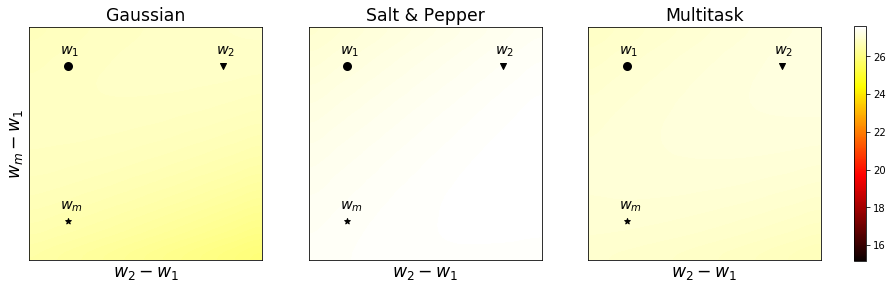

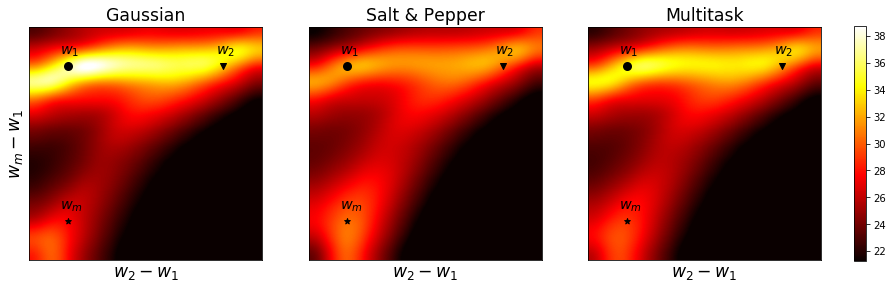

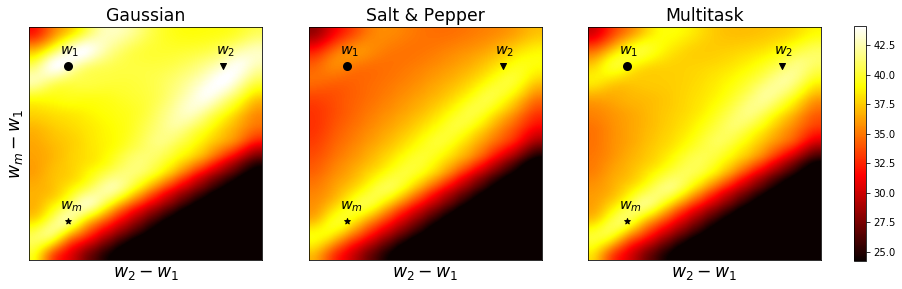

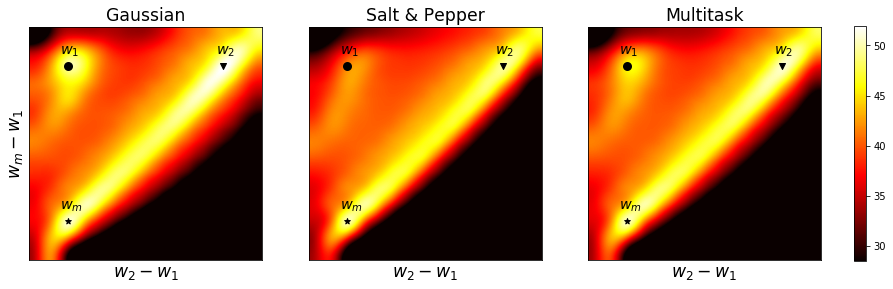

In [304]:
def rev_plot_multiple_surfaces(surface_list, title):
    fig, ax = plt.subplots(1, len(surface_list), figsize=(15, 7), sharey=True)
    # Find max abs value
    max_val = max([s.max() for s in surface_list])
    min_val = min([s.min() for s in surface_list])
    for i, surface in enumerate(surface_list):
        im = ax[i].imshow(surface, cmap=plt.cm.hot,
                       interpolation='lanczos',
                       vmin=0.55* max_val,
                       vmax=max_val,
        #                origin='lower',
        #                extent=[t1[j, 0], t1[j, 1], t2[j, 0], t2[j, 1]]
                      )

        dxy = 0.1
        dxz = 0.1
        margin = 0.2
        t_xys = np.arange(-margin, 1. + margin +dxy, dxy).tolist()
        t_xzs = np.arange(-margin, 1. + margin +dxz, dxz).tolist()

#         if i==2:
#             plt.colorbar()
#     #     plt.colorbar(fraction=0.046, pad=0.04)
        ax[i].set_xlabel(r'$w_2 - w_1$', fontsize='xx-large')
        color_name = 'black'
        if i == 0:
            ax[i].set_ylabel(r'$w_m - w_1$', fontsize='xx-large')
        ax[i].annotate(s=r'$w_1$', xy=(2, 2),
                     xytext=(1.5, 1.25),
                     color=color_name, fontsize='x-large')
        ax[i].annotate(s=r'$w_2$', xy=(surface.shape[1] - 2, surface.shape[1] - 2),
                     xytext=(11.5, 1.25),
                     color=color_name, fontsize='x-large')
        ax[i].annotate(s=r'$w_m$', xy=(2, surface.shape[1] - 2),
                     xytext=(1.5, 11.25),
                     color=color_name, fontsize='x-large')
        ax[i].scatter(2, 2, c=color_name, marker='o', linewidth=3)
        ax[i].scatter(surface.shape[1] - 3, 2, c=color_name, marker='v')
        ax[i].scatter(2, surface.shape[0] - 3, c=color_name, marker='*')
        ax[i].set_xticks([])
        ax[i].set_yticks([])

    ax[0].set_title('Gaussian', fontsize='xx-large')
    ax[1].set_title('Salt & Pepper', fontsize='xx-large')
    ax[2].set_title('Multitask', fontsize='xx-large')
#     plt.axis('tight')
    fig.colorbar(im, ax=ax.ravel().tolist(), fraction=0.014, pad=0.04)
#     plt.show()
#     plt.tight_layout()
    fig.savefig('{}.pdf'.format(title), dpi=300)


for epoch_cnt in [0, 25, 100, 500]:
    surface_list = []
    for task in ['gaussian', 'salt_and_pepper']:
        results = interp_loss_results[epoch_cnt][task]
        l1_loss_surface = np.zeros([len(t_xys), len(t_xzs)])
        psnr_loss_surface = np.zeros([len(t_xys), len(t_xzs)])
        for i, t_xy in enumerate(t_xys):
            for j, t_xz in enumerate(t_xzs):
                l1_loss_surface[i, j] = results[t_xy][t_xz]['L1']
                psnr_loss_surface[i, j] = results[t_xy][t_xz]['PSNR']
        surface_list.append(psnr_loss_surface)
        
    # Compute the multitask loss surface
#     print(surface_list[0].shape)
#     print(surface_list[1].shape)
#     print(((surface_list[0] + surface_list[1]) / 2.).shape)
    surface_list.append(((surface_list[0] + surface_list[1])/ 2.))
    rev_plot_multiple_surfaces(surface_list,
                               'Epoch_{}_Loss_{}'.format(epoch_cnt, 'PSNR'))